# About Dataset

## Context
### Problem Statement

Customer Personality Analysis is a detailed analysis of a company’s ideal customers. It helps a business to better understand its customers and makes it easier for them to modify products according to the specific needs, behaviors and concerns of different types of customers.

Customer personality analysis helps a business to modify its product based on its target customers from different types of customer segments. For example, instead of spending money to market a new product to every customer in the company’s database, a company can analyze which customer segment is most likely to buy the product and then market the product only on that particular segment.

## Content
### Attributes

### People

**ID:** Customer's unique identifier

**Year_Birth:** Customer's birth year

**Education:** Customer's education level

**Marital_Status:** Customer's marital status

**Income:** Customer's yearly household income

**Kidhome:** Number of children in customer's household

**Teenhome:** Number of teenagers in customer's household

**Dt_Customer:** Date of customer's enrollment with the company

**Recency:** Number of days since customer's last purchase

**Complain:** 1 if the customer complained in the last 2 years, 0 otherwise

### Products

**MntWines:** Amount spent on wine in last 2 years

**MntFruits:** Amount spent on fruits in last 2 years

**MntMeatProducts:** Amount spent on meat in last 2 years

**MntFishProducts:** Amount spent on fish in last 2 years

**MntSweetProducts:** Amount spent on sweets in last 2 years

**MntGoldProds:** Amount spent on gold in last 2 years

### Promotion

**NumDealsPurchases**: Number of purchases made with a discount

**AcceptedCmp1:** 1 if customer accepted the offer in the 1st campaign, 0 otherwise

**AcceptedCmp2:** 1 if customer accepted the offer in the 2nd campaign, 0 otherwise

**AcceptedCmp3:** 1 if customer accepted the offer in the 3rd campaign, 0 otherwise

**AcceptedCmp4:** 1 if customer accepted the offer in the 4th campaign, 0 otherwise

**AcceptedCmp5:** 1 if customer accepted the offer in the 5th campaign, 0 otherwise

**Response:** 1 if customer accepted the offer in the last campaign, 0 otherwise


### Place

**NumWebPurchases:** Number of purchases made through the company’s website

**NumCatalogPurchases:** Number of purchases made using a catalogue

**NumStorePurchases:** Number of purchases made directly in stores

**NumWebVisitsMonth:** Number of visits to company’s website in the last month


### Target
Need to perform clustering to summarize customer segments.

In [3]:
import pandas as pd
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from sklearn.linear_model import LogisticRegression
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import seaborn as sns
import os

from sklearn.cluster import KMeans
from sklearn import metrics
from scipy.spatial.distance import cdist
from sklearn import svm

import warnings
warnings.filterwarnings('ignore')

In [4]:
# Loading dataset
data = pd.read_csv('marketing_campaign.csv', sep='\t')
data

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
0,5524,1957,Graduation,Single,58138.0,0,0,04-09-2012,58,635,...,7,0,0,0,0,0,0,3,11,1
1,2174,1954,Graduation,Single,46344.0,1,1,08-03-2014,38,11,...,5,0,0,0,0,0,0,3,11,0
2,4141,1965,Graduation,Together,71613.0,0,0,21-08-2013,26,426,...,4,0,0,0,0,0,0,3,11,0
3,6182,1984,Graduation,Together,26646.0,1,0,10-02-2014,26,11,...,6,0,0,0,0,0,0,3,11,0
4,5324,1981,PhD,Married,58293.0,1,0,19-01-2014,94,173,...,5,0,0,0,0,0,0,3,11,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2235,10870,1967,Graduation,Married,61223.0,0,1,13-06-2013,46,709,...,5,0,0,0,0,0,0,3,11,0
2236,4001,1946,PhD,Together,64014.0,2,1,10-06-2014,56,406,...,7,0,0,0,1,0,0,3,11,0
2237,7270,1981,Graduation,Divorced,56981.0,0,0,25-01-2014,91,908,...,6,0,1,0,0,0,0,3,11,0
2238,8235,1956,Master,Together,69245.0,0,1,24-01-2014,8,428,...,3,0,0,0,0,0,0,3,11,0


In [5]:
data.info(verbose=True, show_counts=True)
df = data.copy()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2240 entries, 0 to 2239
Data columns (total 29 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   ID                   2240 non-null   int64  
 1   Year_Birth           2240 non-null   int64  
 2   Education            2240 non-null   object 
 3   Marital_Status       2240 non-null   object 
 4   Income               2216 non-null   float64
 5   Kidhome              2240 non-null   int64  
 6   Teenhome             2240 non-null   int64  
 7   Dt_Customer          2240 non-null   object 
 8   Recency              2240 non-null   int64  
 9   MntWines             2240 non-null   int64  
 10  MntFruits            2240 non-null   int64  
 11  MntMeatProducts      2240 non-null   int64  
 12  MntFishProducts      2240 non-null   int64  
 13  MntSweetProducts     2240 non-null   int64  
 14  MntGoldProds         2240 non-null   int64  
 15  NumDealsPurchases    2240 non-null   i

In [6]:
list_keys = df.columns.tolist()
df_describe = df[list_keys]
df_describe.describe()

,ID,Year_Birth,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
count,2240.000000,2240.000000,2216.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,...,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.0,2240.0,2240.000000
mean,5592.159821,1968.805804,52247.251354,0.444196,0.506250,49.109375,303.935714,26.302232,166.950000,37.525446,...,5.316518,0.072768,0.074554,0.072768,0.064286,0.013393,0.009375,3.0,11.0,0.149107
std,3246.662198,11.984069,25173.076661,0.538398,0.544538,28.962453,336.597393,39.773434,225.715373,54.628979,...,2.426645,0.259813,0.262728,0.259813,0.245316,0.114976,0.096391,0.0,0.0,0.356274
min,0.000000,1893.000000,1730.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000
25%,2828.250000,1959.000000,35303.000000,0.000000,0.000000,24.000000,23.750000,1.000000,16.000000,3.000000,...,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000
50%,5458.500000,1970.000000,51381.500000,0.000000,0.000000,49.000000,173.500000,8.000000,67.000000,12.000000,...,6.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000
75%,8427.750000,1977.000000,68522.000000,1.000000,1.000000,74.000000,504.250000,33.000000,232.000000,50.000000,...,7.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000
max,11191.000000,1996.000000,666666.000000,2.000000,2.000000,99.000000,1493.000000,199.000000,1725.000000,259.000000,...,20.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,3.0,11.0,1.000000


In [7]:
# Null data
df.isnull().sum()

ID                      0
Year_Birth              0
Education               0
Marital_Status          0
Income                 24
Kidhome                 0
Teenhome                0
Dt_Customer             0
Recency                 0
MntWines                0
MntFruits               0
MntMeatProducts         0
MntFishProducts         0
MntSweetProducts        0
MntGoldProds            0
NumDealsPurchases       0
NumWebPurchases         0
NumCatalogPurchases     0
NumStorePurchases       0
NumWebVisitsMonth       0
AcceptedCmp3            0
AcceptedCmp4            0
AcceptedCmp5            0
AcceptedCmp1            0
AcceptedCmp2            0
Complain                0
Z_CostContact           0
Z_Revenue               0
Response                0
dtype: int64

In [8]:
# Delete missing values
df = df.dropna()
df.isnull().sum()

ID                     0
Year_Birth             0
Education              0
Marital_Status         0
Income                 0
Kidhome                0
Teenhome               0
Dt_Customer            0
Recency                0
MntWines               0
MntFruits              0
MntMeatProducts        0
MntFishProducts        0
MntSweetProducts       0
MntGoldProds           0
NumDealsPurchases      0
NumWebPurchases        0
NumCatalogPurchases    0
NumStorePurchases      0
NumWebVisitsMonth      0
AcceptedCmp3           0
AcceptedCmp4           0
AcceptedCmp5           0
AcceptedCmp1           0
AcceptedCmp2           0
Complain               0
Z_CostContact          0
Z_Revenue              0
Response               0
dtype: int64

In [9]:
# Check for duplicated values
df.duplicated().sum()

0

In [10]:
# Show unique values for column
df.nunique()

ID                     2216
Year_Birth               59
Education                 5
Marital_Status            8
Income                 1974
Kidhome                   3
Teenhome                  3
Dt_Customer             662
Recency                 100
MntWines                776
MntFruits               158
MntMeatProducts         554
MntFishProducts         182
MntSweetProducts        176
MntGoldProds            212
NumDealsPurchases        15
NumWebPurchases          15
NumCatalogPurchases      14
NumStorePurchases        14
NumWebVisitsMonth        16
AcceptedCmp3              2
AcceptedCmp4              2
AcceptedCmp5              2
AcceptedCmp1              2
AcceptedCmp2              2
Complain                  2
Z_CostContact             1
Z_Revenue                 1
Response                  2
dtype: int64

## Transforming Data

### Not numeric columns
Education

Marital_Status

Dt_Customer

In [11]:
#df['Education'].unique()
data["Education"].value_counts()

Education
Graduation    1127
PhD            486
Master         370
2n Cycle       203
Basic           54
Name: count, dtype: int64

In [12]:
#df['Marital_Status'].unique()
data["Marital_Status"].value_counts()


Marital_Status
Married     864
Together    580
Single      480
Divorced    232
Widow        77
Alone         3
Absurd        2
YOLO          2
Name: count, dtype: int64

In [13]:
df['Dt_Customer'].unique()

array(['04-09-2012', '08-03-2014', '21-08-2013', '10-02-2014',
       '19-01-2014', '09-09-2013', '13-11-2012', '08-05-2013',
       '06-06-2013', '13-03-2014', '15-11-2013', '10-10-2012',
       '24-11-2012', '24-12-2012', '31-08-2012', '28-03-2013',
       '03-11-2012', '08-08-2012', '06-01-2013', '23-12-2012',
       '11-01-2014', '18-03-2013', '02-01-2013', '27-05-2013',
       '31-05-2013', '22-11-2013', '22-05-2014', '11-05-2013',
       '29-10-2012', '20-02-2013', '29-08-2013', '31-12-2013',
       '02-09-2013', '11-02-2014', '01-02-2013', '29-04-2013',
       '12-03-2013', '02-10-2013', '28-06-2014', '09-11-2012',
       '24-05-2013', '08-11-2012', '12-05-2014', '11-08-2012',
       '07-06-2014', '12-06-2013', '19-11-2012', '02-04-2013',
       '28-04-2014', '03-03-2014', '04-07-2013', '07-09-2012',
       '18-02-2013', '11-06-2013', '06-12-2013', '21-05-2013',
       '11-05-2014', '19-03-2014', '27-09-2013', '08-04-2013',
       '11-09-2012', '17-03-2013', '05-04-2013', '30-04

In [14]:
df["Dt_Customer"] = pd.to_datetime(data["Dt_Customer"], format='mixed')
df["Dt_Customer"] 

0      2012-04-09
1      2014-08-03
2      2013-08-21
3      2014-10-02
4      2014-01-19
          ...    
2235   2013-06-13
2236   2014-10-06
2237   2014-01-25
2238   2014-01-24
2239   2012-10-15
Name: Dt_Customer, Length: 2216, dtype: datetime64[ns]

In [15]:
education_mapping = {'Graduation':1, 'PhD':2, 'Master':2, 'Basic':0, '2n Cycle':1}
marital_status_mapping = {'Single':1, 'Together':0, 'Married':0, 'Divorced':1, 'Widow':1, 'Alone':1,'Absurd':1, 'YOLO':1}

df = df.replace({'Education': education_mapping, 'Marital_Status': marital_status_mapping})

                           ID  Year_Birth  Education  Marital_Status  \
ID                   1.000000    0.002355  -0.014776       -0.017921   
Year_Birth           0.002355    1.000000  -0.177416       -0.002033   
Education           -0.014776   -0.177416   1.000000       -0.001639   
Marital_Status      -0.017921   -0.002033  -0.001639        1.000000   
Income               0.013095   -0.161791   0.130644       -0.004663   
Kidhome              0.001736    0.233615  -0.041259       -0.026788   
Teenhome            -0.003030   -0.350791   0.123733       -0.031651   
Dt_Customer          0.006275   -0.026243   0.066631        0.003027   
Recency             -0.044376   -0.016295  -0.023818        0.001371   
MntWines            -0.021084   -0.159451   0.191181        0.007244   
MntFruits            0.007326   -0.017747  -0.085600        0.025988   
MntMeatProducts     -0.005902   -0.033697   0.031395        0.023313   
MntFishProducts     -0.023992   -0.040425  -0.098541        0.01

<Axes: >

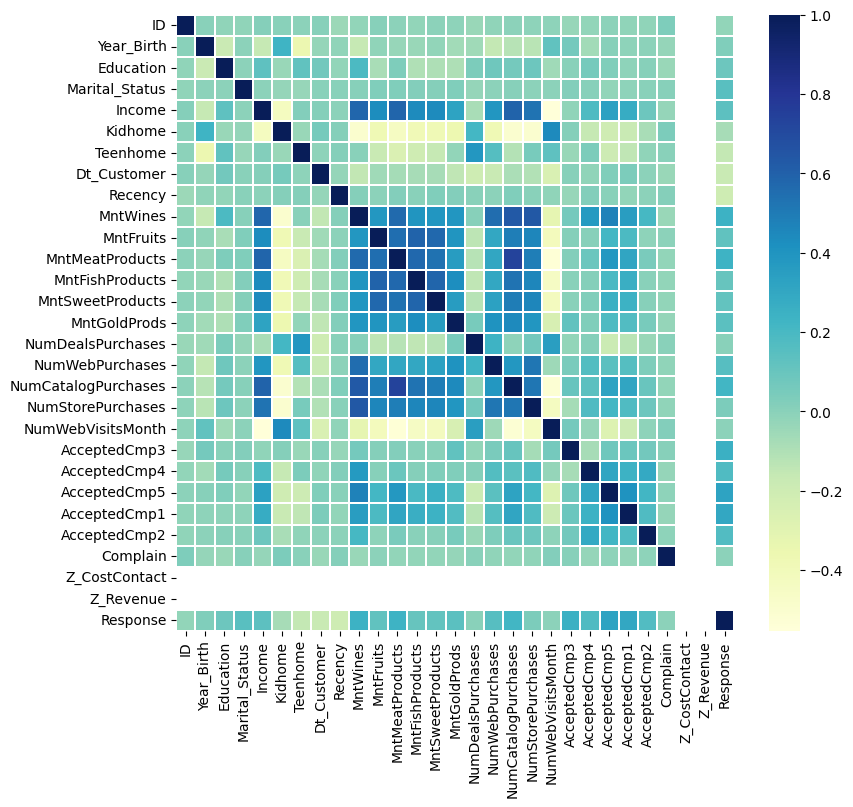

In [16]:
# Getting the correlation 
print(df.corr())
corrmat = df.corr() 
  
f, ax = plt.subplots(figsize =(9, 8)) 
sns.heatmap(corrmat, ax = ax, cmap ="YlGnBu", linewidths = 0.1) 

## Data Engineering

In [17]:
# Status Alone (0: Alone, 1: Partner)
df["Alone"] = df["Marital_Status"].replace(marital_status_mapping)

# Education levels (0: undergraduate, graduate: 1, postgraduate: 2)
df["Education"] = df["Education"].replace(education_mapping)

# Total spending
df["Spent"] = df["MntWines"] + df["MntFruits"] + df["MntMeatProducts"] + df["MntFishProducts"]+  df["MntSweetProducts"] + df["MntGoldProds"]

# Total children
df["Children"] = df["Kidhome"] + df["Teenhome"]

# Total members
df["Family_Size"] = df["Alone"].replace({1: 1, 0:2}) + df["Children"]

# Dropping redundant features
to_drop = ["Marital_Status", "Dt_Customer", "Z_CostContact", "Z_Revenue", "Year_Birth", "ID"]
df = df.drop(to_drop, axis=1)

In [18]:
df.describe()

,Education,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,...,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response,Alone,Spent,Children,Family_Size
count,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,...,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000
mean,1.357401,52247.251354,0.441787,0.505415,49.012635,305.091606,26.356047,166.995939,37.637635,27.028881,...,0.074007,0.073105,0.064079,0.013538,0.009477,0.150271,0.354693,607.075361,0.947202,2.592509
std,0.527757,25173.076661,0.536896,0.544181,28.948352,337.327920,39.793917,224.283273,54.752082,41.072046,...,0.261842,0.260367,0.244950,0.115588,0.096907,0.357417,0.478528,602.900476,0.749062,0.905722
min,0.000000,1730.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,0.000000,1.000000
25%,1.000000,35303.000000,0.000000,0.000000,24.000000,24.000000,2.000000,16.000000,3.000000,1.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,69.000000,0.000000,2.000000
50%,1.000000,51381.500000,0.000000,0.000000,49.000000,174.500000,8.000000,68.000000,12.000000,8.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,396.500000,1.000000,3.000000
75%,2.000000,68522.000000,1.000000,1.000000,74.000000,505.000000,33.000000,232.250000,50.000000,33.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1048.000000,1.000000,3.000000
max,2.000000,666666.000000,2.000000,2.000000,99.000000,1493.000000,199.000000,1725.000000,259.000000,262.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,2525.000000,3.000000,5.000000


                     Education    Income   Kidhome  Teenhome   Recency  \
Education             1.000000  0.130644 -0.041259  0.123733 -0.023818   
Income                0.130644  1.000000 -0.428669  0.019133 -0.003970   
Kidhome              -0.041259 -0.428669  1.000000 -0.039869  0.011492   
Teenhome              0.123733  0.019133 -0.039869  1.000000  0.013838   
Recency              -0.023818 -0.003970  0.011492  0.013838  1.000000   
MntWines              0.191181  0.578650 -0.497336  0.003747  0.015721   
MntFruits            -0.085600  0.430842 -0.373396 -0.176558 -0.005844   
MntMeatProducts       0.031395  0.584633 -0.439261 -0.261122  0.022518   
MntFishProducts      -0.098541  0.438871 -0.388884 -0.205242  0.000551   
MntSweetProducts     -0.097451  0.440744 -0.378026 -0.163056  0.025110   
MntGoldProds         -0.095730  0.325916 -0.355029 -0.019887  0.017663   
NumDealsPurchases     0.036795 -0.083101  0.216913  0.386246  0.002115   
NumWebPurchases       0.083471  0.3878

<Axes: >

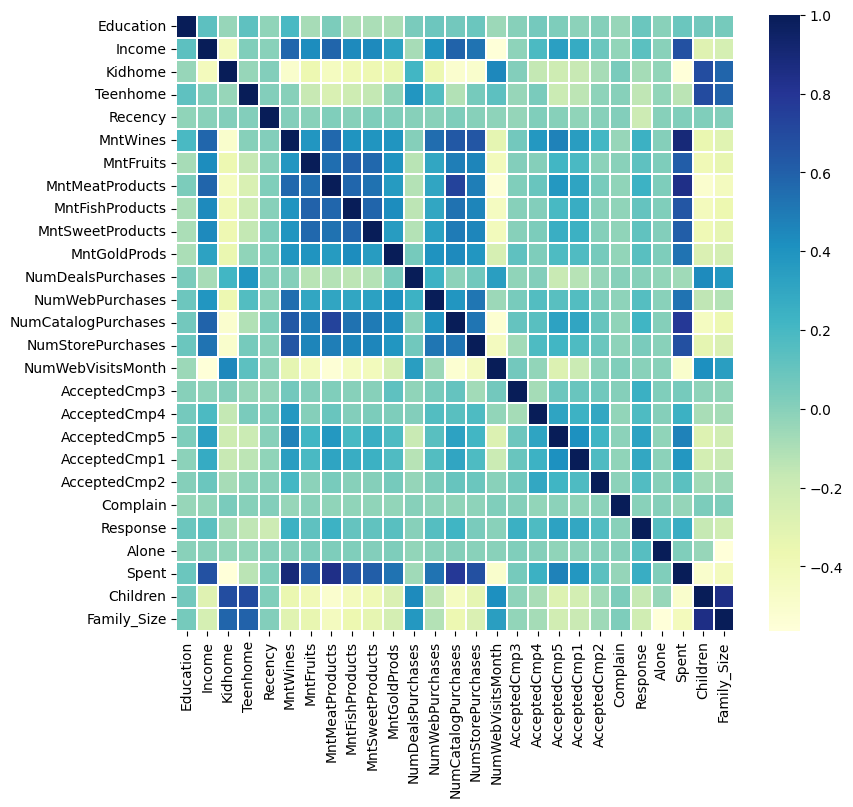

In [19]:
# Getting the correlation 
print(df.corr())
corrmat = df.corr() 
  
f, ax = plt.subplots(figsize =(9, 8)) 
sns.heatmap(corrmat, ax = ax, cmap ="YlGnBu", linewidths = 0.1) 

## Univariate analysis

### Education

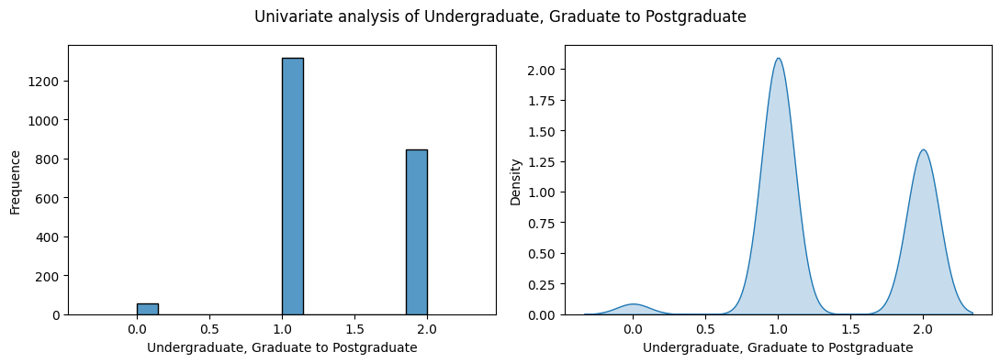

In [20]:
var = 'Education'
var_title = 'Undergraduate, Graduate to Postgraduate'

# Adjusting figure
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(11, 4), sharex=True)

# Plot histogram
sns.histplot(data=df[var], ax=ax[0], kde=False)
ax[0].set_xlabel(var_title)
ax[0].set_ylabel('Frequence')

# Plot density curve
sns.kdeplot(data=df[var], ax=ax[1], fill=True)
ax[1].set_xlabel(var_title)
ax[1].set_ylabel('Density')

fig.suptitle('Univariate analysis of ' + var_title)

plt.tight_layout()

### Income

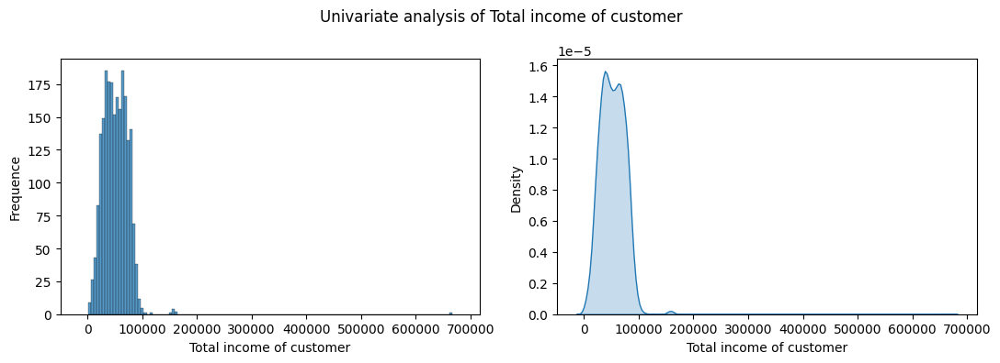

In [21]:
var = 'Income'
var_title = 'Total income of customer'

# Adjusting figure
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(11, 4), sharex=True)

# Plot histogram
sns.histplot(data=df[var], ax=ax[0], kde=False)
ax[0].set_xlabel(var_title)
ax[0].set_ylabel('Frequence')

# Plot density curve
sns.kdeplot(data=df[var], ax=ax[1], fill=True)
ax[1].set_xlabel(var_title)
ax[1].set_ylabel('Density')

fig.suptitle('Univariate analysis of ' + var_title)

plt.tight_layout()

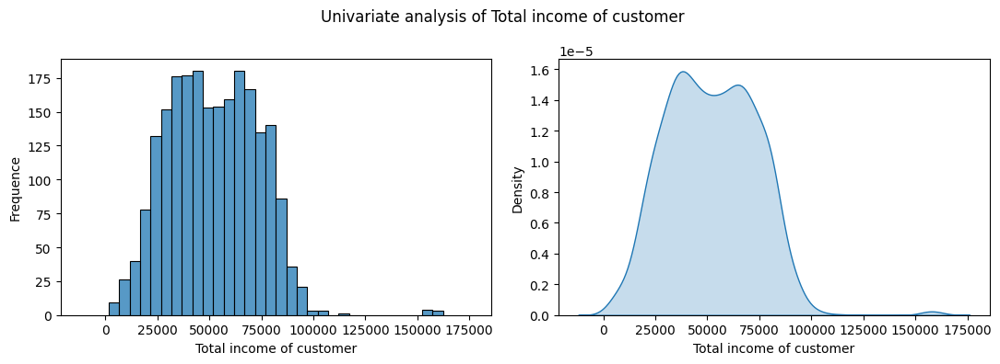

In [22]:
df = df.loc[df['Income'] < 200000] # (???) ask how to remove by percentage
var = 'Income'
var_title = 'Total income of customer'

# Adjusting figure
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(11, 4), sharex=True)

# Plot histogram
sns.histplot(data=df[var], ax=ax[0], kde=False)
ax[0].set_xlabel(var_title)
ax[0].set_ylabel('Frequence')

# Plot density curve
sns.kdeplot(data=df[var], ax=ax[1], fill=True)
ax[1].set_xlabel(var_title)
ax[1].set_ylabel('Density')

fig.suptitle('Univariate analysis of ' + var_title)

plt.tight_layout()

### Kidhome

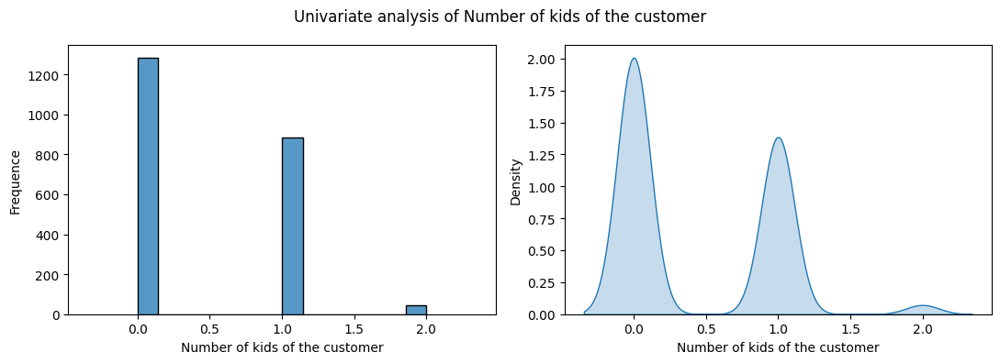

In [23]:
var = 'Kidhome'
var_title = 'Number of kids of the customer'

# Adjusting figure
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(11, 4), sharex=True)

# Plot histogram
sns.histplot(data=df[var], ax=ax[0], kde=False)
ax[0].set_xlabel(var_title)
ax[0].set_ylabel('Frequence')

# Plot density curve
sns.kdeplot(data=df[var], ax=ax[1], fill=True)
ax[1].set_xlabel(var_title)
ax[1].set_ylabel('Density')

fig.suptitle('Univariate analysis of ' + var_title)

plt.tight_layout()

### Teenhome

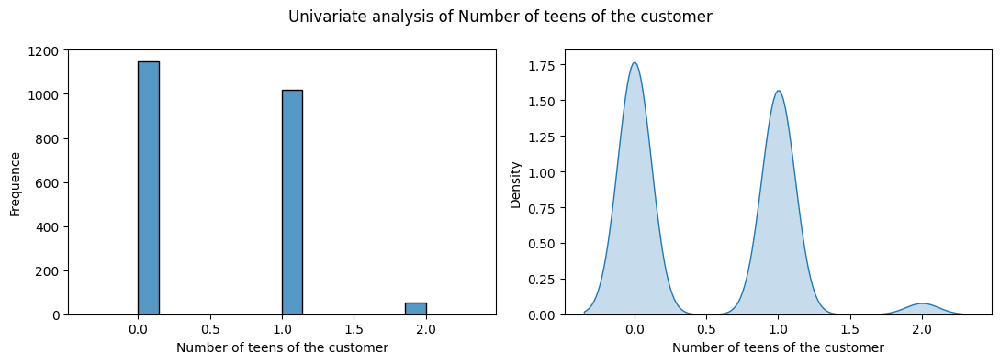

In [24]:
var = 'Teenhome'
var_title = 'Number of teens of the customer'

# Adjusting figure
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(11, 4), sharex=True)

# Plot histogram
sns.histplot(data=df[var], ax=ax[0], kde=False)
ax[0].set_xlabel(var_title)
ax[0].set_ylabel('Frequence')

# Plot density curve
sns.kdeplot(data=df[var], ax=ax[1], fill=True)
ax[1].set_xlabel(var_title)
ax[1].set_ylabel('Density')

fig.suptitle('Univariate analysis of ' + var_title)

plt.tight_layout()

### Children

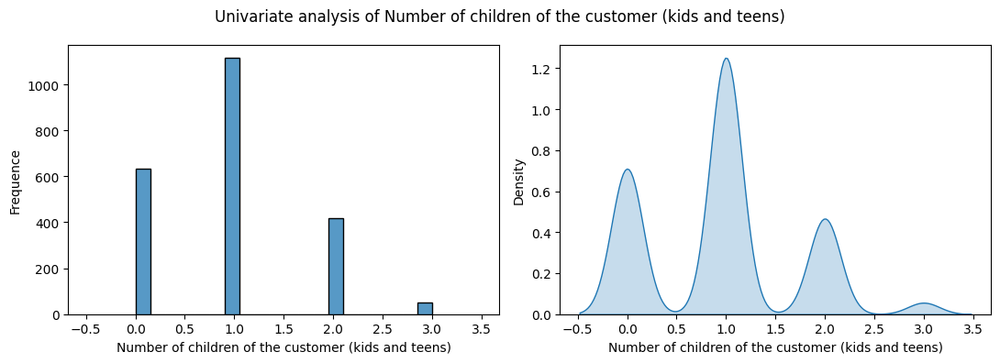

In [25]:
var = 'Children'
var_title = 'Number of children of the customer (kids and teens)'

# Adjusting figure
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(11, 4), sharex=True)

# Plot histogram
sns.histplot(data=df[var], ax=ax[0], kde=False)
ax[0].set_xlabel(var_title)
ax[0].set_ylabel('Frequence')

# Plot density curve
sns.kdeplot(data=df[var], ax=ax[1], fill=True)
ax[1].set_xlabel(var_title)
ax[1].set_ylabel('Density')

fig.suptitle('Univariate analysis of ' + var_title)

plt.tight_layout()

### Alone 

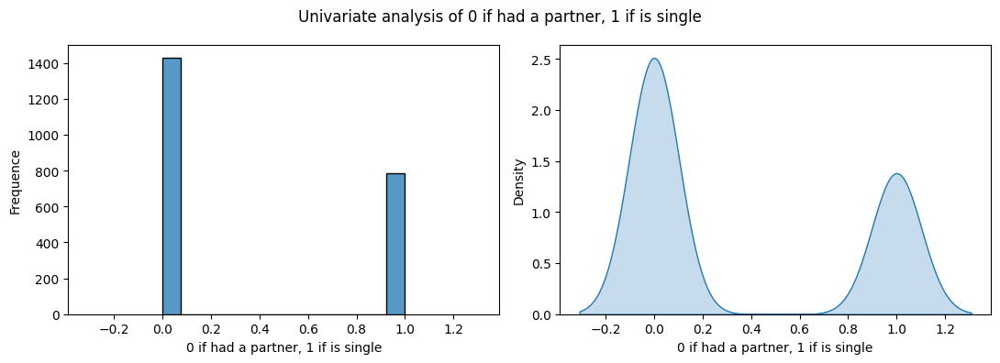

In [26]:
var = 'Alone'
var_title = '0 if had a partner, 1 if is single'

# Adjusting figure
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(11, 4), sharex=True)

# Plot histogram
sns.histplot(data=df[var], ax=ax[0], kde=False)
ax[0].set_xlabel(var_title)
ax[0].set_ylabel('Frequence')

# Plot density curve
sns.kdeplot(data=df[var], ax=ax[1], fill=True)
ax[1].set_xlabel(var_title)
ax[1].set_ylabel('Density')

fig.suptitle('Univariate analysis of ' + var_title)

plt.tight_layout()

### Family size

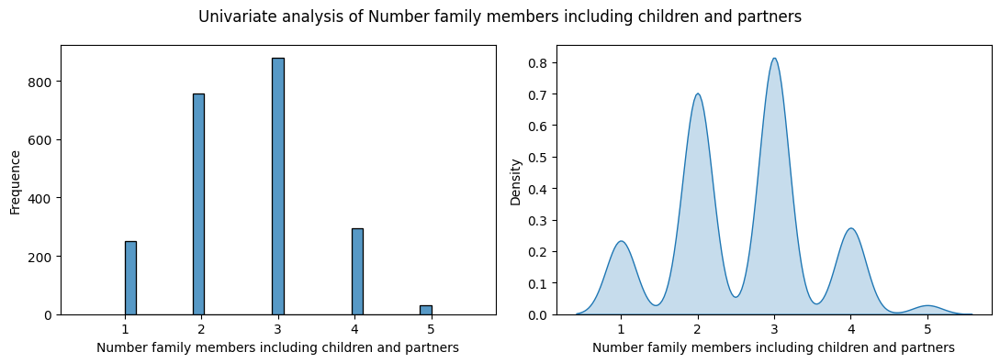

In [27]:
var = 'Family_Size'
var_title = 'Number family members including children and partners'

# Adjusting figure
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(11, 4), sharex=True)

# Plot histogram
sns.histplot(data=df[var], ax=ax[0], kde=False)
ax[0].set_xlabel(var_title)
ax[0].set_ylabel('Frequence')

# Plot density curve
sns.kdeplot(data=df[var], ax=ax[1], fill=True)
ax[1].set_xlabel(var_title)
ax[1].set_ylabel('Density')

fig.suptitle('Univariate analysis of ' + var_title)

plt.tight_layout()

### Spent

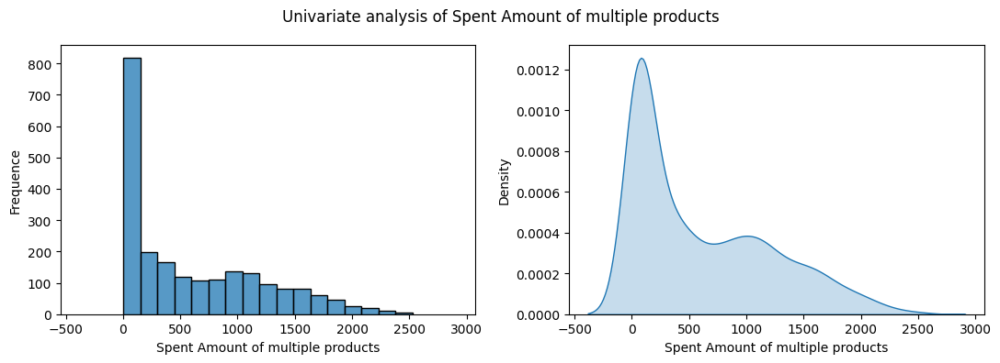

In [28]:
var = 'Spent'
var_title = 'Spent Amount of multiple products'

# Adjusting figure
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(11, 4), sharex=True)

# Plot histogram
sns.histplot(data=df[var], ax=ax[0], kde=False)
ax[0].set_xlabel(var_title)
ax[0].set_ylabel('Frequence')

# Plot density curve
sns.kdeplot(data=df[var], ax=ax[1], fill=True)
ax[1].set_xlabel(var_title)
ax[1].set_ylabel('Density')

fig.suptitle('Univariate analysis of ' + var_title)

plt.tight_layout()

### Deal Purchases

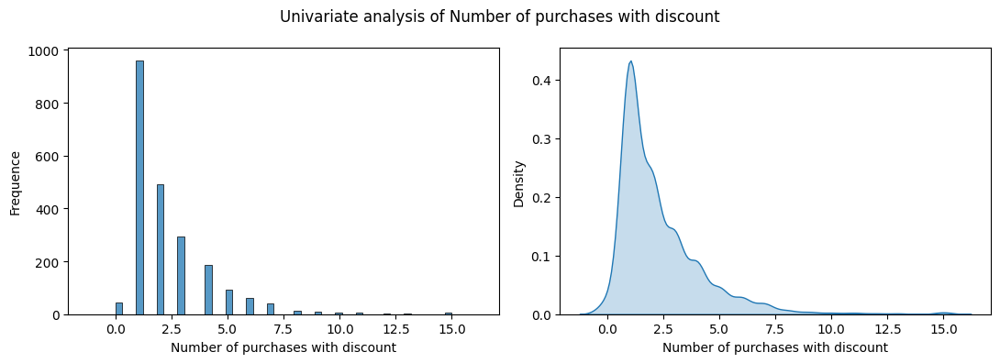

In [29]:
var = 'NumDealsPurchases'
var_title = 'Number of purchases with discount'

# Adjusting figure
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(11, 4), sharex=True)

# Plot histogram
sns.histplot(data=df[var], ax=ax[0], kde=False)
ax[0].set_xlabel(var_title)
ax[0].set_ylabel('Frequence')

# Plot density curve
sns.kdeplot(data=df[var], ax=ax[1], fill=True)
ax[1].set_xlabel(var_title)
ax[1].set_ylabel('Density')

fig.suptitle('Univariate analysis of ' + var_title)

plt.tight_layout()

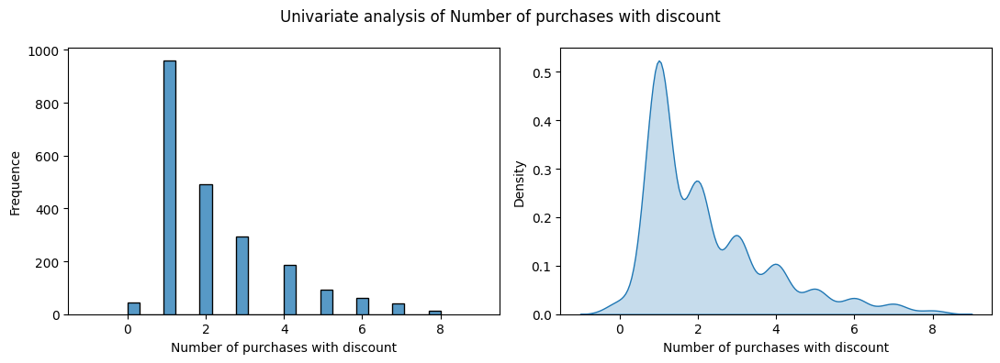

In [30]:
var = 'NumDealsPurchases'
var_title = 'Number of purchases with discount'
df = df.loc[df['NumDealsPurchases'] < 9] # (???) ask how to remove by percentage

# Adjusting figure
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(11, 4), sharex=True)

# Plot histogram
sns.histplot(data=df[var], ax=ax[0], kde=False)
ax[0].set_xlabel(var_title)
ax[0].set_ylabel('Frequence')

# Plot density curve
sns.kdeplot(data=df[var], ax=ax[1], fill=True)
ax[1].set_xlabel(var_title)
ax[1].set_ylabel('Density')

fig.suptitle('Univariate analysis of ' + var_title)

plt.tight_layout()

### Web Purchases

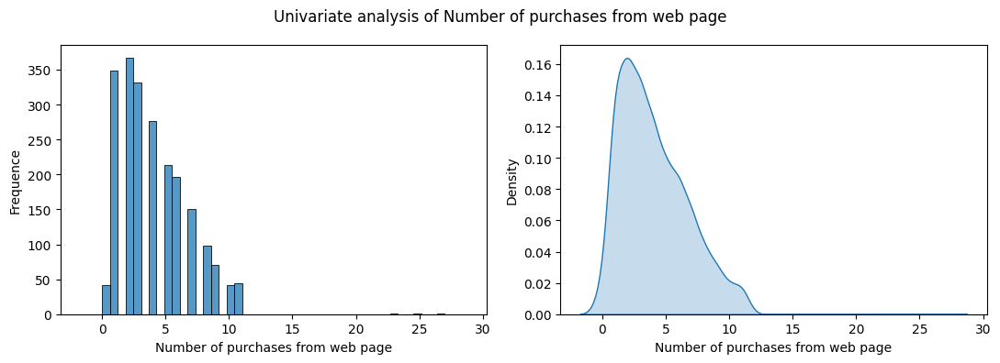

In [31]:
var = 'NumWebPurchases'
var_title = 'Number of purchases from web page'

# Adjusting figure
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(11, 4), sharex=True)

# Plot histogram
sns.histplot(data=df[var], ax=ax[0], kde=False)
ax[0].set_xlabel(var_title)
ax[0].set_ylabel('Frequence')

# Plot density curve
sns.kdeplot(data=df[var], ax=ax[1], fill=True)
ax[1].set_xlabel(var_title)
ax[1].set_ylabel('Density')

fig.suptitle('Univariate analysis of ' + var_title)

plt.tight_layout()

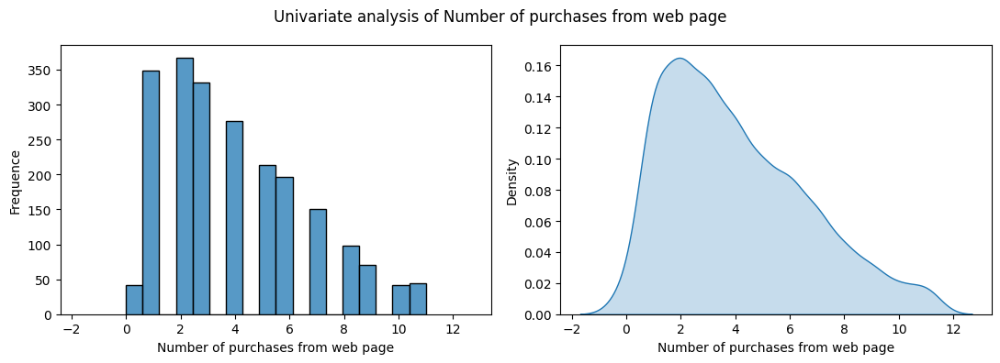

In [32]:
var = 'NumWebPurchases'
var_title = 'Number of purchases from web page'
df = df.loc[df['NumWebPurchases'] < 12] # (???) ask how to remove by percentage

# Adjusting figure
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(11, 4), sharex=True)

# Plot histogram
sns.histplot(data=df[var], ax=ax[0], kde=False)
ax[0].set_xlabel(var_title)
ax[0].set_ylabel('Frequence')

# Plot density curve
sns.kdeplot(data=df[var], ax=ax[1], fill=True)
ax[1].set_xlabel(var_title)
ax[1].set_ylabel('Density')

fig.suptitle('Univariate analysis of ' + var_title)

plt.tight_layout()

### Catalog Purchases

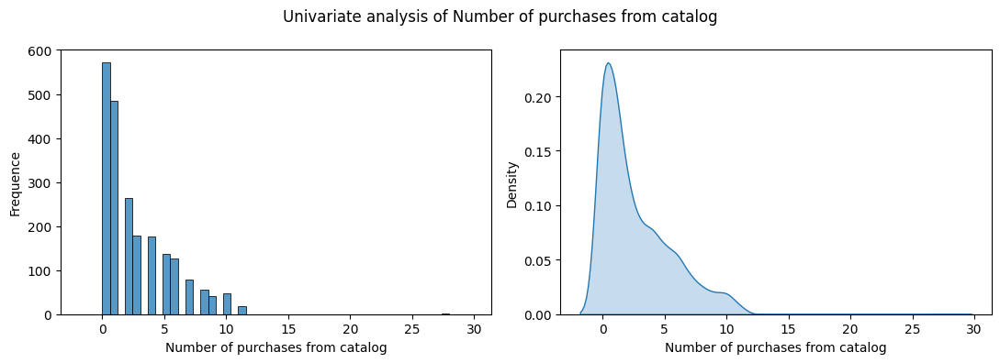

In [33]:
var = 'NumCatalogPurchases'
var_title = 'Number of purchases from catalog'

# Adjusting figure
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(11, 4), sharex=True)

# Plot histogram
sns.histplot(data=df[var], ax=ax[0], kde=False)
ax[0].set_xlabel(var_title)
ax[0].set_ylabel('Frequence')

# Plot density curve
sns.kdeplot(data=df[var], ax=ax[1], fill=True)
ax[1].set_xlabel(var_title)
ax[1].set_ylabel('Density')

fig.suptitle('Univariate analysis of ' + var_title)

plt.tight_layout()

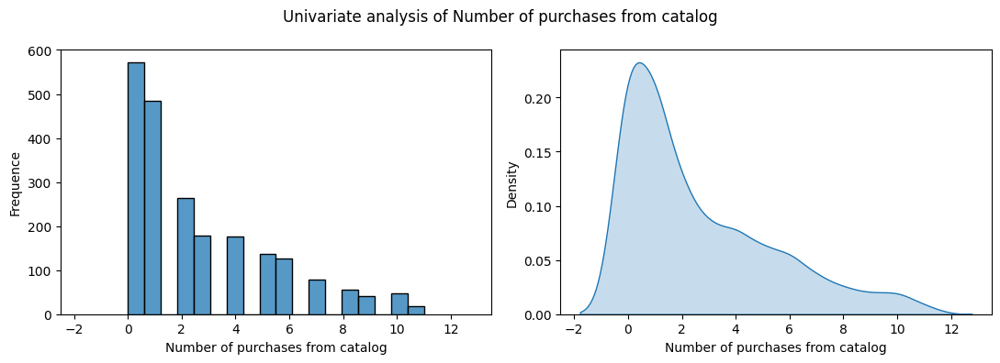

In [34]:
var = 'NumCatalogPurchases'
var_title = 'Number of purchases from catalog'
df = df.loc[df['NumCatalogPurchases'] < 12] # (???) ask how to remove by percentage

# Adjusting figure
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(11, 4), sharex=True)

# Plot histogram
sns.histplot(data=df[var], ax=ax[0], kde=False)
ax[0].set_xlabel(var_title)
ax[0].set_ylabel('Frequence')

# Plot density curve
sns.kdeplot(data=df[var], ax=ax[1], fill=True)
ax[1].set_xlabel(var_title)
ax[1].set_ylabel('Density')

fig.suptitle('Univariate analysis of ' + var_title)

plt.tight_layout()

### Store Purchases

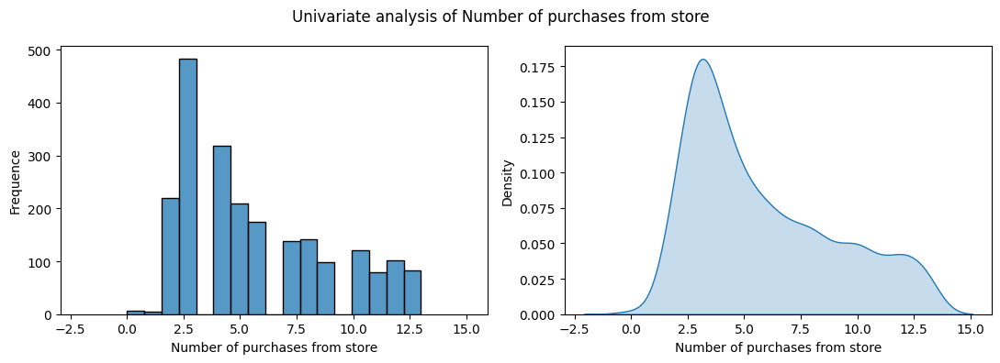

In [35]:
var = 'NumStorePurchases'
var_title = 'Number of purchases from store'

# Adjusting figure
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(11, 4), sharex=True)

# Plot histogram
sns.histplot(data=df[var], ax=ax[0], kde=False)
ax[0].set_xlabel(var_title)
ax[0].set_ylabel('Frequence')

# Plot density curve
sns.kdeplot(data=df[var], ax=ax[1], fill=True)
ax[1].set_xlabel(var_title)
ax[1].set_ylabel('Density')

fig.suptitle('Univariate analysis of ' + var_title)

plt.tight_layout()

### Web Visits per Month

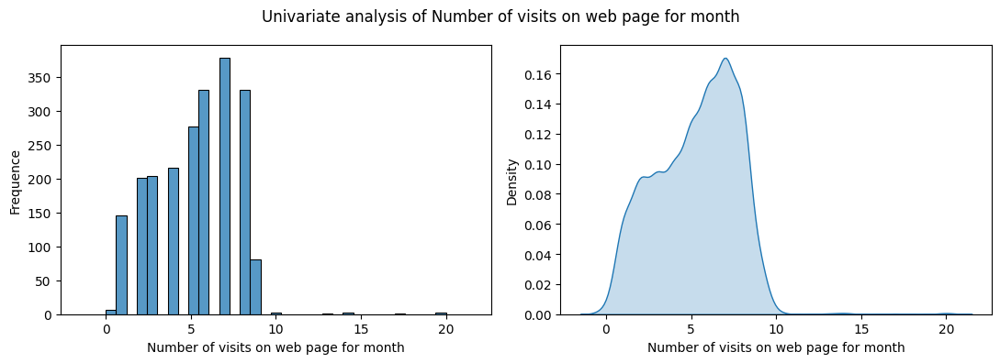

In [36]:
var = 'NumWebVisitsMonth'
var_title = 'Number of visits on web page for month'

# Adjusting figure
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(11, 4), sharex=True)

# Plot histogram
sns.histplot(data=df[var], ax=ax[0], kde=False)
ax[0].set_xlabel(var_title)
ax[0].set_ylabel('Frequence')

# Plot density curve
sns.kdeplot(data=df[var], ax=ax[1], fill=True)
ax[1].set_xlabel(var_title)
ax[1].set_ylabel('Density')

fig.suptitle('Univariate analysis of ' + var_title)

plt.tight_layout()

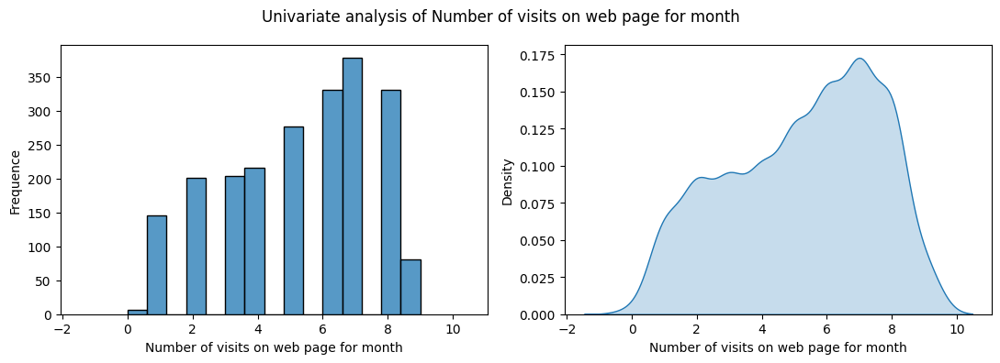

In [37]:
var = 'NumWebVisitsMonth'
var_title = 'Number of visits on web page for month'
df = df.loc[df['NumWebVisitsMonth'] < 10] # (???) ask how to remove by percentage

# Adjusting figure
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(11, 4), sharex=True)

# Plot histogram
sns.histplot(data=df[var], ax=ax[0], kde=False)
ax[0].set_xlabel(var_title)
ax[0].set_ylabel('Frequence')

# Plot density curve
sns.kdeplot(data=df[var], ax=ax[1], fill=True)
ax[1].set_xlabel(var_title)
ax[1].set_ylabel('Density')

fig.suptitle('Univariate analysis of ' + var_title)

plt.tight_layout()

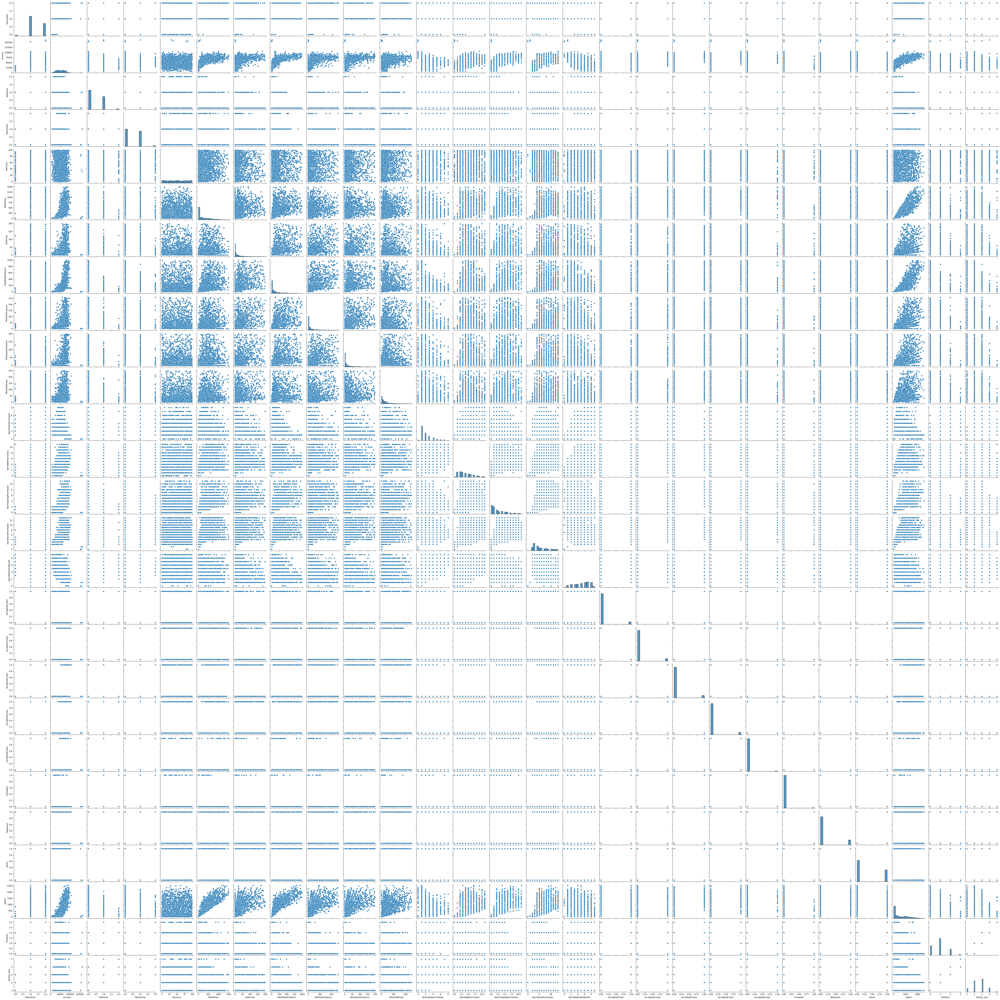

In [38]:
# All numeric data compared with all of them
df_test = df
sns.pairplot(df_test, diag_kind="hist")

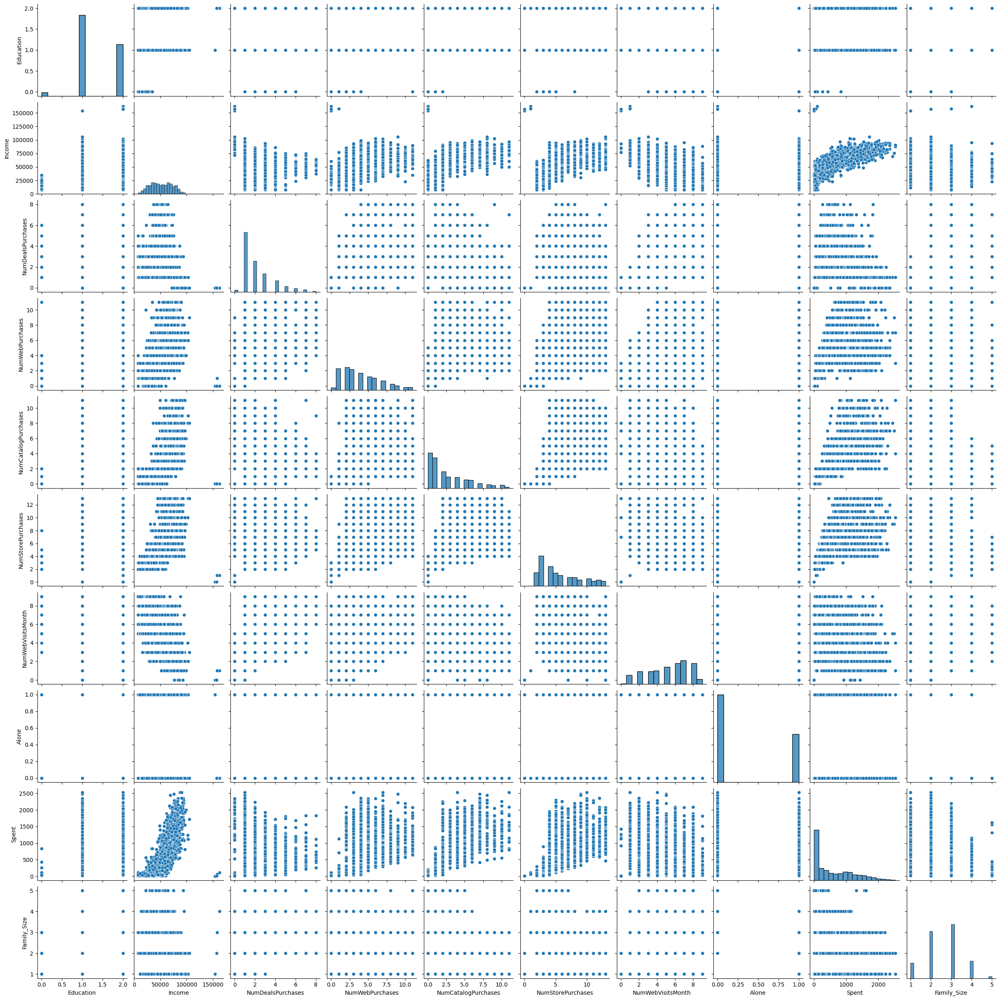

In [39]:
# All numeric data compared with all of them
delete = ['AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1','AcceptedCmp2', 'Complain', 'Response', 'Kidhome', 'Teenhome', 'Children',
    'Recency', 'MntWines', 'MntFruits', 'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts', 'MntGoldProds']
df_test = df_test.drop(delete, axis=1)
sns.pairplot(df_test, diag_kind="hist")

3.7.3
0.12.2


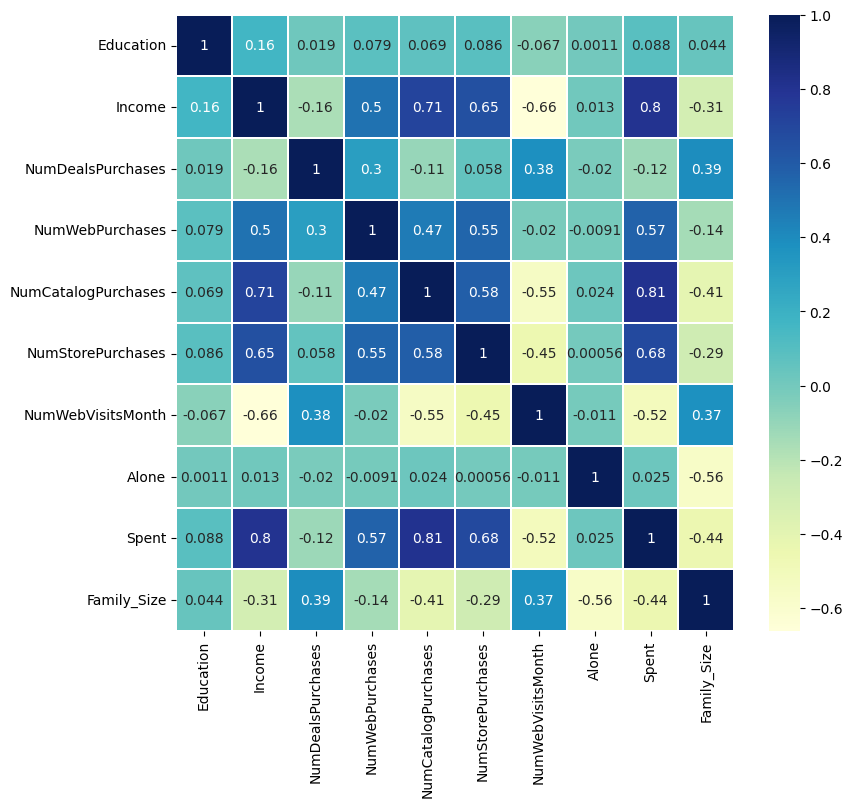

In [40]:
# Getting the correlation 
#print(df_test.corr())
corrmat = df_test.corr() 
  
f, ax = plt.subplots(figsize =(9, 8)) 
sns.heatmap(corrmat, ax = ax, cmap ="YlGnBu", linewidths = 0.1, annot=True) 
#sns.heatmap(df_test.corr() ,annot=True) 
print(matplotlib.__version__)
print(sns.__version__)

## Multivariate analysis

### NumCatalogPurchases vs Income

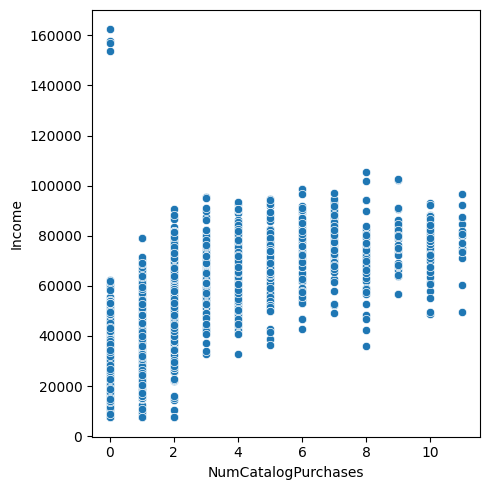

In [41]:
fig, ax = plt.subplots(figsize=(5, 5))
sns.scatterplot(data=df, x="NumCatalogPurchases", y="Income", ax=ax)
plt.tight_layout()

### NumStorePurchases vs Income

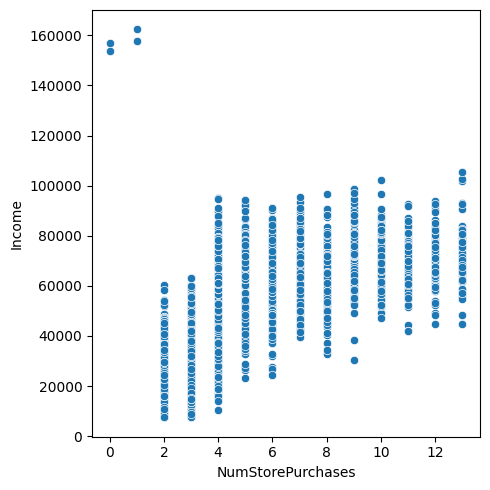

In [42]:
fig, ax = plt.subplots(figsize=(5, 5))
sns.scatterplot(data=df, x="NumStorePurchases", y="Income", ax=ax)
plt.tight_layout()

### Spent vs Income

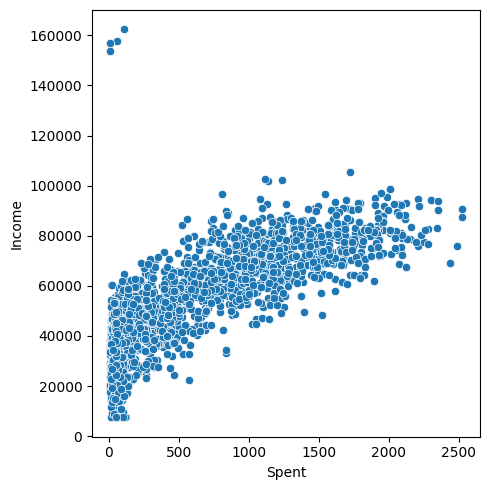

In [43]:
fig, ax = plt.subplots(figsize=(5, 5))
sns.scatterplot(data=df, x="Spent", y="Income", ax=ax)
plt.tight_layout()

### Spent vs NumCatalogPurchases

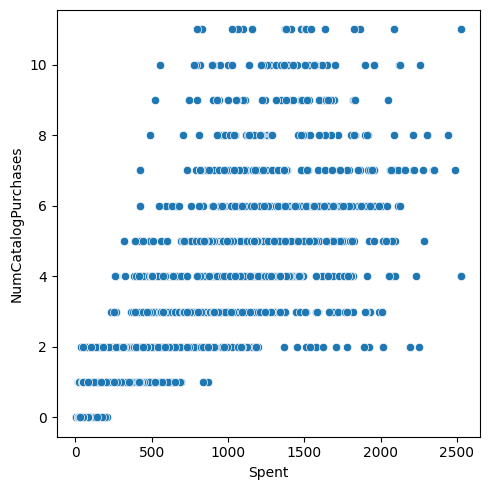

In [44]:
fig, ax = plt.subplots(figsize=(5, 5))
sns.scatterplot(data=df, x="Spent", y="NumCatalogPurchases", ax=ax)
plt.tight_layout()

### Spent vs NumStorePurchases

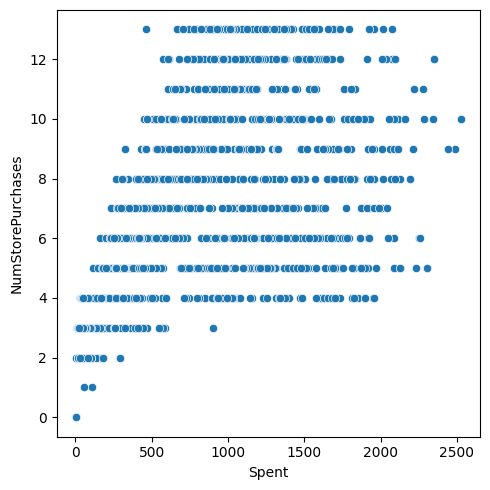

In [45]:
fig, ax = plt.subplots(figsize=(5, 5))
sns.scatterplot(data=df, x="Spent", y="NumStorePurchases", ax=ax)
plt.tight_layout()

## Set Train y testing

In [46]:
X, y = df, df
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=0)
sc = StandardScaler()
X_train_std = sc.fit_transform(X_train)
X_test_std = sc.transform(X_test)

## PCA

In [47]:
# Component numbers
pca = PCA(n_components = 9)
X_train_pca = pca.fit_transform(X_train)
X_test_pca = pca.transform(X_test)

In [48]:
# Acumulated variance ratio with new dimentions 
expl = pca.explained_variance_ratio_
print(expl)
print('suma',sum(expl))

[9.99501859e-01 4.15449500e-04 6.31933006e-05 1.07064334e-05
 3.43170539e-06 2.00099545e-06 1.86056302e-06 1.45722301e-06
 1.45681597e-08]
suma 0.9999999729979249


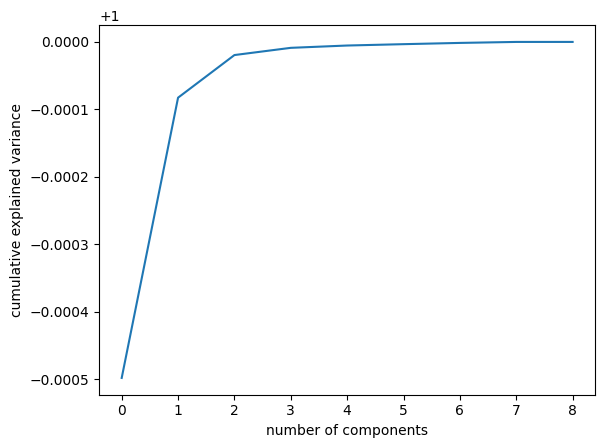

In [49]:
# Plot acumulated variance ratio with new dimentions 
plt.plot(np.cumsum(expl))
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance')
plt.show()

## Principal component analysis (PCA)

In [50]:
pca = PCA(n_components = 3)
X_train_pca = pca.fit_transform(X_train)
X_test_pca = pca.transform(X_test)
df_pca = pd.DataFrame(X_train_pca, columns = ['PC1', 'PC2','PC3'])
df_pca.describe()

,PC1,PC2,PC3
count,1.519000e+03,1.519000e+03,1.519000e+03
mean,1.149592e-12,2.634481e-14,3.532600e-14
std,2.124860e+04,4.332091e+02,1.689561e+02
min,-4.438137e+04,-1.625358e+03,-6.323075e+02
25%,-1.691105e+04,-2.286883e+02,-5.780983e+01
50%,-4.851253e+02,3.696757e+01,9.030046e+00
75%,1.661778e+04,2.495170e+02,5.045783e+01
max,1.104659e+05,3.437725e+03,7.178176e+02


In [51]:
print("Number of train data: " + str(len(X_train_pca)))
print("Number of test data: " + str(len(X_test_pca)))

Number of train data: 1519
Number of test data: 652


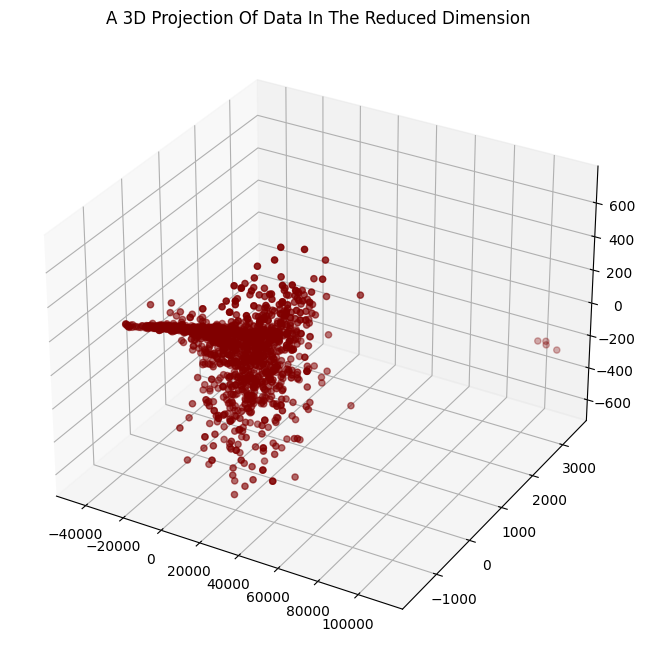

In [52]:
# A 3D Projection Of Data In The Reduced Dimension
x = df_pca["PC1"]
y = df_pca["PC2"]
z = df_pca["PC3"]
# To plot
fig = plt.figure(figsize=(10,8))
ax = fig.add_subplot(111, projection="3d")
ax.scatter(x,y,z, c="maroon", marker="o" )
ax.set_title("A 3D Projection Of Data In The Reduced Dimension")
plt.show()

## Kmeans++ 

### Elbow Method

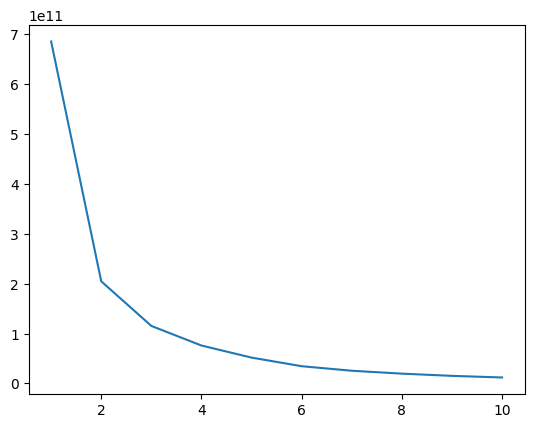

In [53]:
sse = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters=i, init='k-means++', max_iter=300, n_init=20, random_state=0)
    kmeans.fit(X_train_pca)
    sse.append(kmeans.inertia_)
plt.plot(range(1,11),sse)
plt.show() 

### Predicting the clusters

In [54]:
n_clusters_ = 4
kmeans_ = KMeans(n_clusters=n_clusters_, init='k-means++', max_iter=100, n_init=20, random_state=0)
labels = kmeans_.fit(X_train_pca)
y_kmeans = kmeans_.fit_predict(X_train_pca)
centers = kmeans_.cluster_centers_

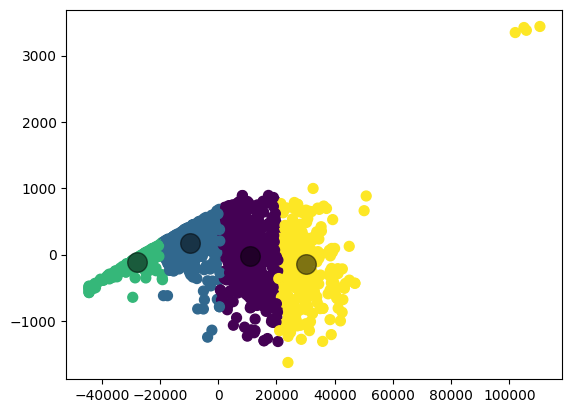

In [55]:
plt.scatter(X_train_pca[:, 0], X_train_pca[:, 1], c=y_kmeans, s=50, cmap='viridis')
plt.scatter(centers[:, 0], centers[:, 1], c='black', s=200, alpha=0.5)

In [56]:
X_pca_plus = df_pca[['PC1', 'PC2','PC3']]

X_pca_plus['labels'] = y_kmeans
X_pca_plus

,PC1,PC2,PC3,labels
0,6140.327110,305.413505,-65.322798,0
1,-5200.986207,53.317093,-68.596671,1
2,-8746.562728,186.484728,-7.638123,1
3,-10878.587797,390.241359,-6.431048,1
4,6650.002812,-579.173316,-350.624349,0
...,...,...,...,...
1514,-16030.058686,226.689707,5.987794,1
1515,-9416.217112,278.127970,-32.755333,1
1516,10993.724231,-803.132137,417.604488,0
1517,-44381.370013,-474.318958,57.844450,2


In [57]:
X_pca_random = df_pca[['PC1', 'PC2','PC3']]

X_pca_random['labels'] = y_kmeans
X_pca_random

,PC1,PC2,PC3,labels
0,6140.327110,305.413505,-65.322798,0
1,-5200.986207,53.317093,-68.596671,1
2,-8746.562728,186.484728,-7.638123,1
3,-10878.587797,390.241359,-6.431048,1
4,6650.002812,-579.173316,-350.624349,0
...,...,...,...,...
1514,-16030.058686,226.689707,5.987794,1
1515,-9416.217112,278.127970,-32.755333,1
1516,10993.724231,-803.132137,417.604488,0
1517,-44381.370013,-474.318958,57.844450,2


<Axes: xlabel='PC1', ylabel='PC2'>

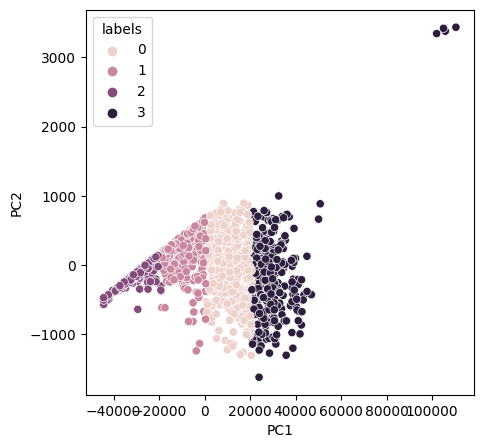

In [58]:
fig, ax = plt.subplots(figsize=(5, 5))
sns.scatterplot(data=X_pca_plus, x="PC1", y="PC2", ax=ax, hue="labels")

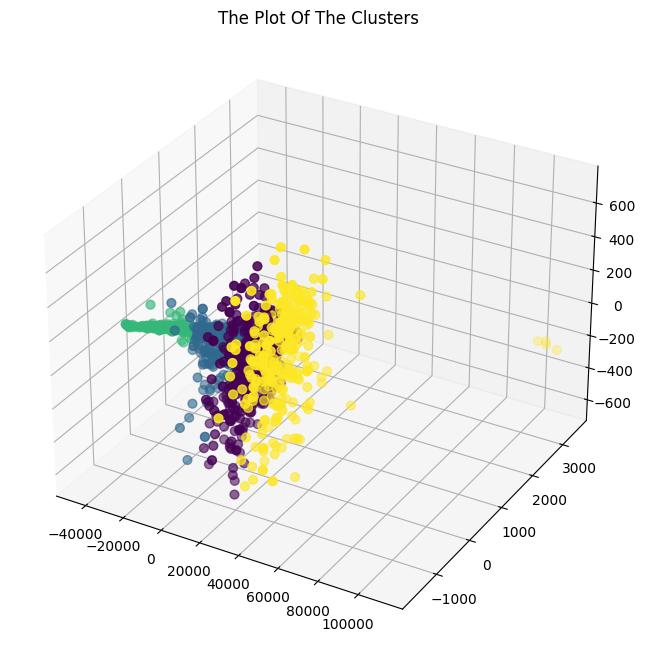

In [59]:
#Plotting the clusters
fig = plt.figure(figsize=(10,8))
ax = plt.subplot(111, projection='3d')
ax.scatter(x, y, z, s=40, c=X_pca_random["labels"], marker='o')
ax.set_title("The Plot Of The Clusters")
plt.show()

## Evaluation

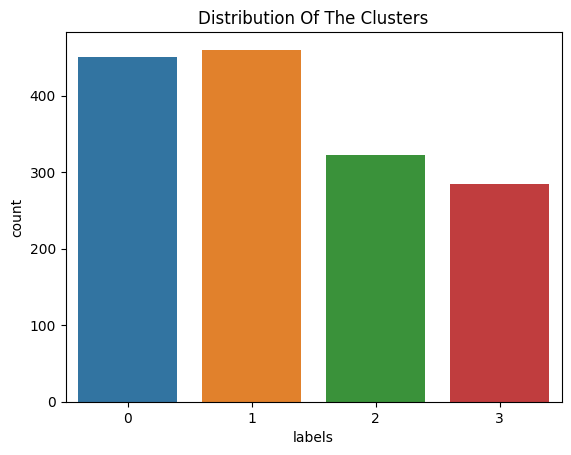

In [60]:
# Plotting frequency of clusters
pl = sns.countplot(x=X_pca_random["labels"])
pl.set_title("Distribution Of The Clusters")
plt.show()

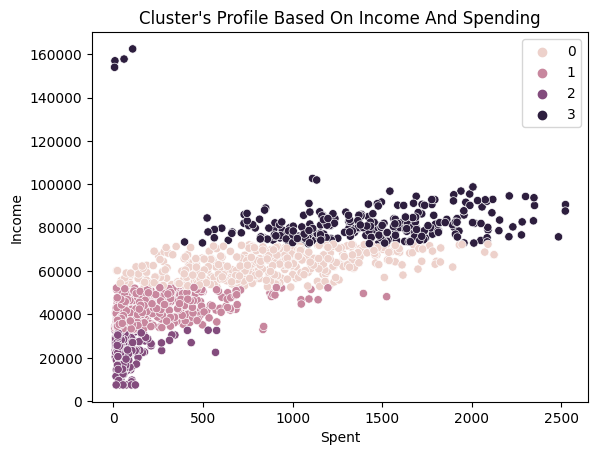

In [61]:
X_train["labels"] = y_kmeans
pl = sns.scatterplot(data=X_train, x=X_train["Spent"], y=X_train["Income"], hue=X_train["labels"])
pl.set_title("Cluster's Profile Based On Income And Spending")
plt.legend()
plt.show()

## SVM

In [62]:
from sklearn import svm
from sklearn.metrics import accuracy_score

In [63]:
X = X_pca_plus[['PC1', 'PC2','PC3']].values
y = X_pca_plus.labels
y

0       0
1       1
2       1
3       1
4       0
       ..
1514    1
1515    1
1516    0
1517    2
1518    0
Name: labels, Length: 1519, dtype: int32

In [64]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30)
clf_svm = svm.SVC(kernel='linear') # Linear Kernel
# Train the model using the training sets
clf_svm.fit(X_train, y_train)

SVC(kernel='linear')

In [65]:
# Predict the response for test dataset
y_pred = clf_svm.predict(X_test)
# Model Accuracy: how often is the classifier correct?
print("Accuracy:",accuracy_score(y_test, y_pred))

Accuracy: 0.993421052631579


## Create dataframe with predict values

In [66]:
df_predict = pd.DataFrame(X_test, columns = ['PC1','PC2','PC3'])
df_predict['labels'] = y_pred
df_predict

,PC1,PC2,PC3,labels
0,23856.756146,-973.453386,8.019827,3
1,-1870.109071,179.557932,-51.268037,1
2,-24980.708015,20.140020,19.160180,2
3,-6687.455734,402.879641,7.218495,1
4,11952.634499,-683.259653,-278.195814,0
...,...,...,...,...
451,-29299.862610,-142.939558,53.267338,2
452,-10747.795329,399.510201,-12.043516,1
453,-2975.823655,538.507604,-42.478995,1
454,21503.353276,769.650581,-121.395401,3


In [67]:
# Amount test records
len(X)

1519

Text(0.5, 1.0, 'Separate line')

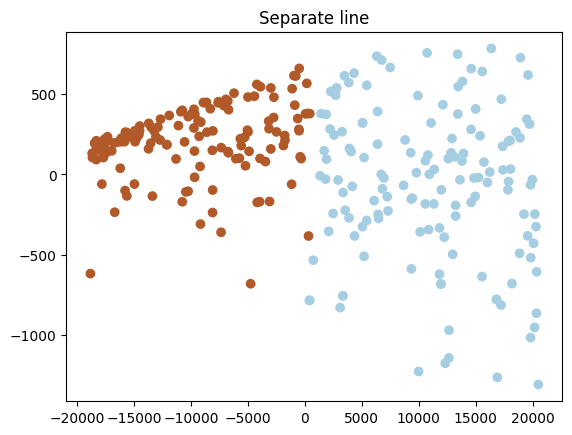

In [69]:
df_plus = df_predict.loc[(df_predict['labels'] == 0) | (df_predict['labels'] == 1)]
X_1 = df_plus[['PC1', 'PC2','PC3']].values
y_1 = df_plus.labels

# Create data
X = X_1
Y = y_1

# Copy model
clf = clf_svm

# Build the line to separate classes
w = clf.coef_[0]
a = -w[0] / w[1]
xx = np.linspace(-5, 5)
yy = a * xx - (clf.intercept_[0]) / w[1]

# support vectors
b = clf.support_vectors_[0]
yy_down = a * xx + (b[1] - a * b[0])
b = clf.support_vectors_[-1]
yy_up = a * xx + (b[1] - a * b[0])

plt.scatter(clf.support_vectors_[:, 0], clf.support_vectors_[:, 1],s=80, facecolors='none')
plt.scatter(X[:, 0], X[:, 1], c=Y, cmap=plt.cm.Paired)

plt.title('Separate line')

Text(0.5, 1.0, 'Separate line')

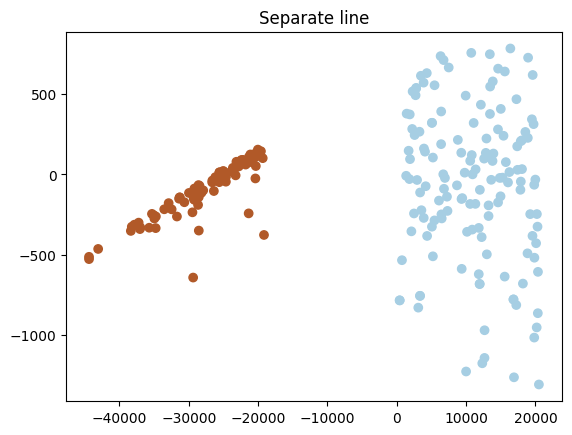

In [70]:
df_plus = df_predict.loc[(df_predict['labels'] == 0) | (df_predict['labels'] == 2)]
X_1 = df_plus[['PC1', 'PC2','PC3']].values
y_1 = df_plus.labels

# Create data
X = X_1
Y = y_1

# Copy model
clf = clf_svm

# Build the line to separate classes
w = clf.coef_[0]
a = -w[0] / w[1]
xx = np.linspace(-5, 5)
yy = a * xx - (clf.intercept_[0]) / w[1]

# support vectors
b = clf.support_vectors_[0]
yy_down = a * xx + (b[1] - a * b[0])
b = clf.support_vectors_[-1]
yy_up = a * xx + (b[1] - a * b[0])

plt.scatter(clf.support_vectors_[:, 0], clf.support_vectors_[:, 1],s=80, facecolors='none')
plt.scatter(X[:, 0], X[:, 1], c=Y, cmap=plt.cm.Paired)

plt.title('Separate line')

Text(0.5, 1.0, 'Separate line')

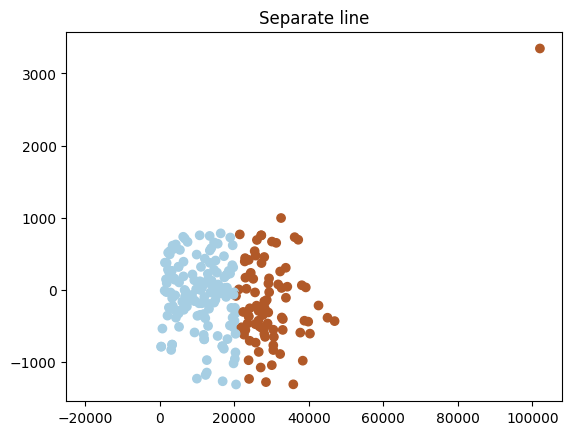

In [71]:
df_plus = df_predict.loc[(df_predict['labels'] == 0) | (df_predict['labels'] == 3)]
X_1 = df_plus[['PC1', 'PC2','PC3']].values
y_1 = df_plus.labels

# Create data
X = X_1
Y = y_1

# Copy model
clf = clf_svm

# Build the line to separate classes
w = clf.coef_[0]
a = -w[0] / w[1]
xx = np.linspace(-5, 5)
yy = a * xx - (clf.intercept_[0]) / w[1]

# support vectors
b = clf.support_vectors_[0]
yy_down = a * xx + (b[1] - a * b[0])
b = clf.support_vectors_[-1]
yy_up = a * xx + (b[1] - a * b[0])

plt.scatter(clf.support_vectors_[:, 0], clf.support_vectors_[:, 1],s=80, facecolors='none')
plt.scatter(X[:, 0], X[:, 1], c=Y, cmap=plt.cm.Paired)

plt.title('Separate line')

Text(0.5, 1.0, 'Separate line')

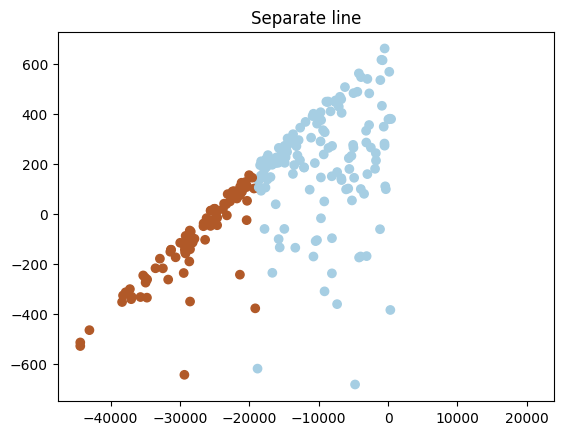

In [72]:
df_plus = df_predict.loc[(df_predict['labels'] == 1) | (df_predict['labels'] == 2)]
X_1 = df_plus[['PC1', 'PC2','PC3']].values
y_1 = df_plus.labels

# Create data
X = X_1
Y = y_1

# Copy model
clf = clf_svm

# Build the line to separate classes
w = clf.coef_[0]
a = -w[0] / w[1]
xx = np.linspace(-5, 5)
yy = a * xx - (clf.intercept_[0]) / w[1]

# support vectors
b = clf.support_vectors_[0]
yy_down = a * xx + (b[1] - a * b[0])
b = clf.support_vectors_[-1]
yy_up = a * xx + (b[1] - a * b[0])

plt.scatter(clf.support_vectors_[:, 0], clf.support_vectors_[:, 1],s=80, facecolors='none')
plt.scatter(X[:, 0], X[:, 1], c=Y, cmap=plt.cm.Paired)

plt.title('Separate line')

Text(0.5, 1.0, 'Separate line')

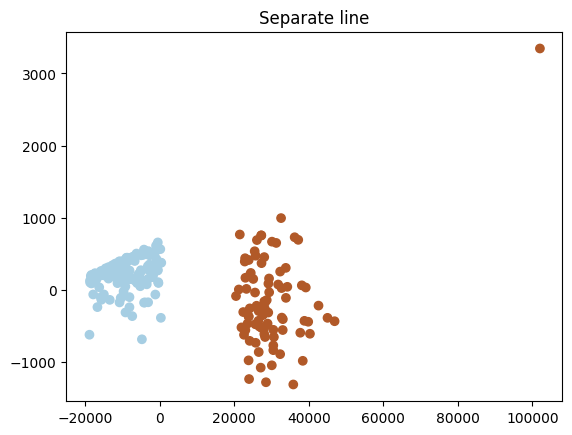

In [73]:
df_plus = df_predict.loc[(df_predict['labels'] == 1) | (df_predict['labels'] == 3)]
X_1 = df_plus[['PC1', 'PC2','PC3']].values
y_1 = df_plus.labels

# Create data
X = X_1
Y = y_1

# Copy model
clf = clf_svm

# Build the line to separate classes
w = clf.coef_[0]
a = -w[0] / w[1]
xx = np.linspace(-5, 5)
yy = a * xx - (clf.intercept_[0]) / w[1]

# support vectors
b = clf.support_vectors_[0]
yy_down = a * xx + (b[1] - a * b[0])
b = clf.support_vectors_[-1]
yy_up = a * xx + (b[1] - a * b[0])

plt.scatter(clf.support_vectors_[:, 0], clf.support_vectors_[:, 1],s=80, facecolors='none')
plt.scatter(X[:, 0], X[:, 1], c=Y, cmap=plt.cm.Paired)

plt.title('Separate line')

Text(0.5, 1.0, 'Separate line')

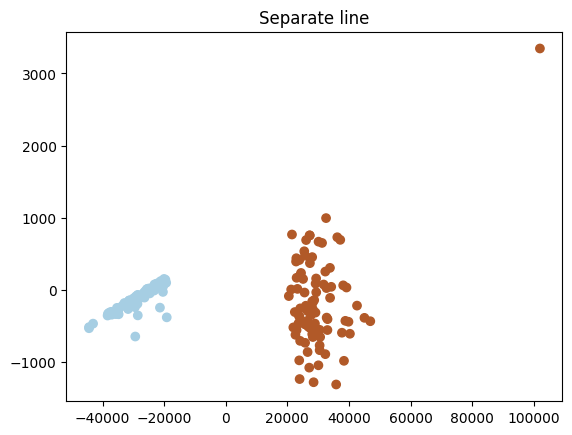

In [74]:
df_plus = df_predict.loc[(df_predict['labels'] == 2) | (df_predict['labels'] == 3)]
X_1 = df_plus[['PC1', 'PC2','PC3']].values
y_1 = df_plus.labels

# Create data
X = X_1
Y = y_1

# Copy model
clf = clf_svm

# Build the line to separate classes
w = clf.coef_[0]
a = -w[0] / w[1]
xx = np.linspace(-5, 5)
yy = a * xx - (clf.intercept_[0]) / w[1]

# support vectors
b = clf.support_vectors_[0]
yy_down = a * xx + (b[1] - a * b[0])
b = clf.support_vectors_[-1]
yy_up = a * xx + (b[1] - a * b[0])

plt.scatter(clf.support_vectors_[:, 0], clf.support_vectors_[:, 1],s=80, facecolors='none')
plt.scatter(X[:, 0], X[:, 1], c=Y, cmap=plt.cm.Paired)

plt.title('Separate line')

<Axes: xlabel='PC1', ylabel='PC3'>

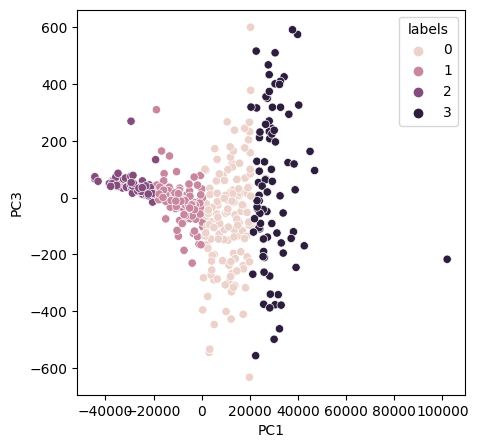

In [75]:
fig, ax = plt.subplots(figsize=(5, 5))
sns.scatterplot(data=df_predict, x="PC1", y="PC3", ax=ax, hue="labels")

# Export

In [76]:
import pickle

pickle_file_pca = 'pca_model_integrador.plk'
with open(pickle_file_pca,'wb') as file:
    pickle.dump(pca, file)

pickle_file_kmeans = 'kmeans_model_integrador.plk'
with open(pickle_file_kmeans, 'wb') as file:
    pickle.dump(kmeans_, file)

pickle_file_svm = 'svm_model_integrador.plk'
with open(pickle_file_svm, 'wb') as file:
    pickle.dump(clf_svm, file)

In [80]:
# PCA
with open(pickle_file_pca,'rb') as file:
    pickle_pca = pickle.load(file)
X_PCA = pickle_pca.transform(df)
len(X_PCA)

2171

In [78]:
# SVM 
with open(pickle_file_svm,'rb') as file:
    pickle_svm = pickle.load(file)
X_SVM = pickle_svm.predict(X_PCA)
X_SVM

array([0, 1, 0, ..., 0, 0, 0], dtype=int32)

In [83]:
df['labels'] = X_SVM
df.to_csv("Customer_classified.csv")
df

,Education,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,...,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response,Alone,Spent,Children,Family_Size,labels
0,1,58138.0,0,0,58,635,88,546,172,88,...,0,0,0,0,1,1,1617,0,1,0
1,1,46344.0,1,1,38,11,1,6,2,1,...,0,0,0,0,0,1,27,2,3,1
2,1,71613.0,0,0,26,426,49,127,111,21,...,0,0,0,0,0,0,776,0,2,0
3,1,26646.0,1,0,26,11,4,20,10,3,...,0,0,0,0,0,0,53,1,3,2
4,2,58293.0,1,0,94,173,43,118,46,27,...,0,0,0,0,0,0,422,1,3,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2235,1,61223.0,0,1,46,709,43,182,42,118,...,0,0,0,0,0,0,1341,1,3,0
2236,2,64014.0,2,1,56,406,0,30,0,0,...,0,1,0,0,0,0,444,3,5,0
2237,1,56981.0,0,0,91,908,48,217,32,12,...,0,0,0,0,0,1,1241,0,1,0
2238,2,69245.0,0,1,8,428,30,214,80,30,...,0,0,0,0,0,0,843,1,3,0


<Axes: xlabel='Spent', ylabel='Income'>

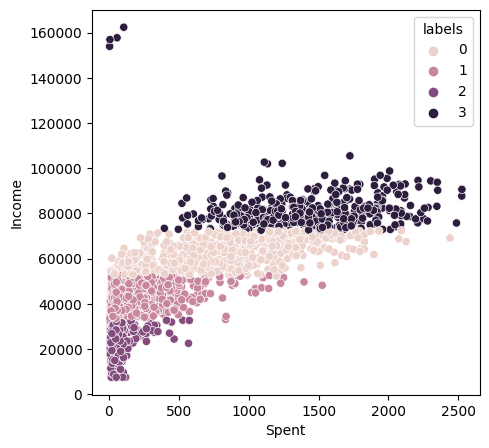

In [86]:
fig, ax = plt.subplots(figsize=(5, 5))
sns.scatterplot(data=df, x="Spent", y="Income", ax=ax, hue="labels")

# Multivariate analysis

In [87]:
df.columns

Index(['Education', 'Income', 'Kidhome', 'Teenhome', 'Recency', 'MntWines',
       'MntFruits', 'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts',
       'MntGoldProds', 'NumDealsPurchases', 'NumWebPurchases',
       'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth',
       'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1',
       'AcceptedCmp2', 'Complain', 'Response', 'Alone', 'Spent', 'Children',
       'Family_Size', 'labels'],
      dtype='object')

## Income

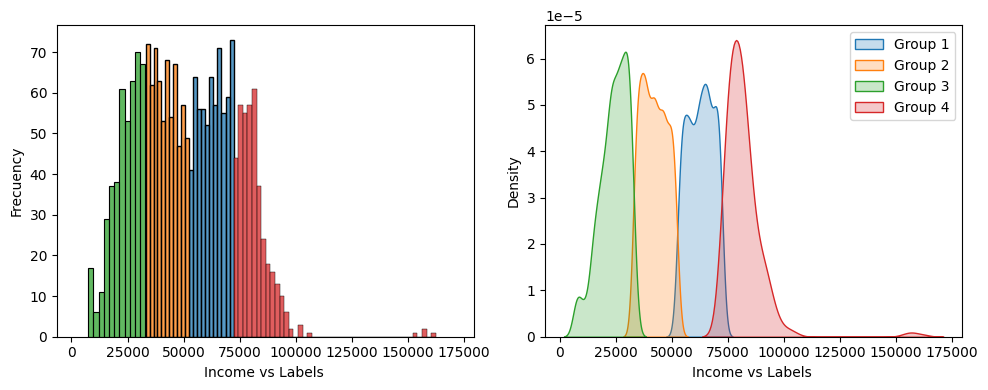

In [89]:
# Income vs Classification
var = 'Income'
var_title = 'Income vs Labels '

filter = df['labels'] == 0
df_segment_1 = df.loc[filter]

filter = df['labels'] == 1
df_segment_2 = df.loc[filter]

filter = df['labels'] == 2
df_segment_3 = df.loc[filter]

filter = df['labels'] == 3
df_segment_4 = df.loc[filter]

# Adjust Matplotlib figure
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(10, 4), sharex=True)

# Histogram for each classification 
sns.histplot(data=df_segment_1, x=var, label="Group 1", kde=False, ax=ax[0])
sns.histplot(data=df_segment_2, x=var, label="Group 2", kde=False, ax=ax[0])
sns.histplot(data=df_segment_3, x=var, label="Group 3", kde=False, ax=ax[0])
sns.histplot(data=df_segment_4, x=var, label="Group 4", kde=False, ax=ax[0])
ax[0].set_xlabel(var_title)
ax[0].set_ylabel('Frecuency')

# Density curve for each classification 
sns.kdeplot(data=df_segment_1, x=var, label="Group 1", fill=True, ax=ax[1])
sns.kdeplot(data=df_segment_2,  x=var, label="Group 2", fill=True, ax=ax[1])
sns.kdeplot(data=df_segment_3,  x=var, label="Group 3", fill=True, ax=ax[1])
sns.kdeplot(data=df_segment_4,  x=var, label="Group 4", fill=True, ax=ax[1])
ax[1].set_xlabel(var_title)
ax[1].set_ylabel('Density')
ax[1].legend()

plt.tight_layout()

## Family_Size

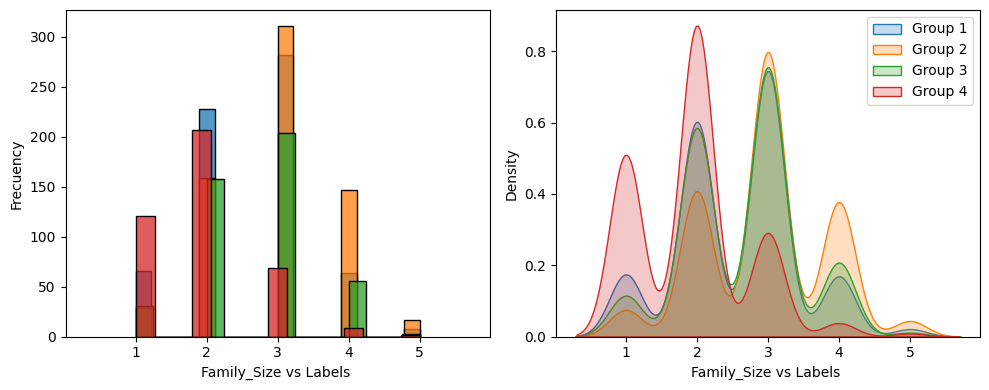

In [90]:
# Family_Size vs Classification
var = 'Family_Size'
var_title = 'Family_Size vs Labels '

filter = df['labels'] == 0
df_segment_1 = df.loc[filter]

filter = df['labels'] == 1
df_segment_2 = df.loc[filter]

filter = df['labels'] == 2
df_segment_3 = df.loc[filter]

filter = df['labels'] == 3
df_segment_4 = df.loc[filter]

# Adjust Matplotlib figure
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(10, 4), sharex=True)

# Histogram for each classification 
sns.histplot(data=df_segment_1, x=var, label="Group 1", kde=False, ax=ax[0])
sns.histplot(data=df_segment_2, x=var, label="Group 2", kde=False, ax=ax[0])
sns.histplot(data=df_segment_3, x=var, label="Group 3", kde=False, ax=ax[0])
sns.histplot(data=df_segment_4, x=var, label="Group 4", kde=False, ax=ax[0])
ax[0].set_xlabel(var_title)
ax[0].set_ylabel('Frecuency')

# Density curve for each classification 
sns.kdeplot(data=df_segment_1, x=var, label="Group 1", fill=True, ax=ax[1])
sns.kdeplot(data=df_segment_2,  x=var, label="Group 2", fill=True, ax=ax[1])
sns.kdeplot(data=df_segment_3,  x=var, label="Group 3", fill=True, ax=ax[1])
sns.kdeplot(data=df_segment_4,  x=var, label="Group 4", fill=True, ax=ax[1])
ax[1].set_xlabel(var_title)
ax[1].set_ylabel('Density')
ax[1].legend()

plt.tight_layout()

## Alone

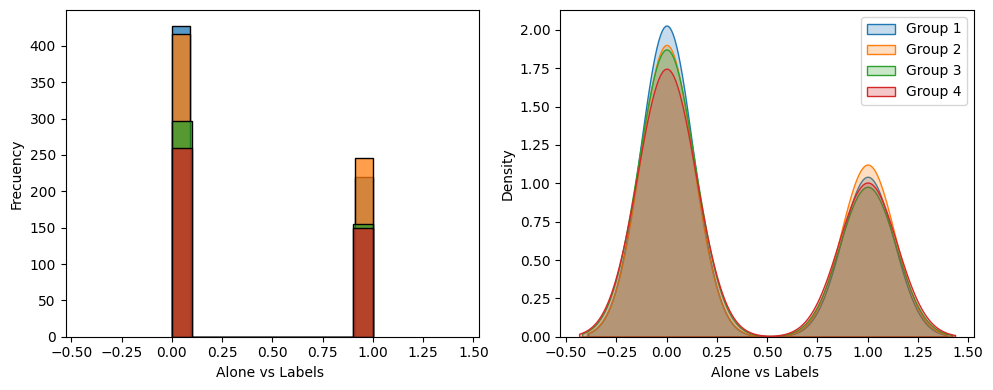

In [91]:
# Alone vs Classification
var = 'Alone'
var_title = 'Alone vs Labels '

filter = df['labels'] == 0
df_segment_1 = df.loc[filter]

filter = df['labels'] == 1
df_segment_2 = df.loc[filter]

filter = df['labels'] == 2
df_segment_3 = df.loc[filter]

filter = df['labels'] == 3
df_segment_4 = df.loc[filter]

# Adjust Matplotlib figure
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(10, 4), sharex=True)

# Histogram for each classification 
sns.histplot(data=df_segment_1, x=var, label="Group 1", kde=False, ax=ax[0])
sns.histplot(data=df_segment_2, x=var, label="Group 2", kde=False, ax=ax[0])
sns.histplot(data=df_segment_3, x=var, label="Group 3", kde=False, ax=ax[0])
sns.histplot(data=df_segment_4, x=var, label="Group 4", kde=False, ax=ax[0])
ax[0].set_xlabel(var_title)
ax[0].set_ylabel('Frecuency')

# Density curve for each classification 
sns.kdeplot(data=df_segment_1, x=var, label="Group 1", fill=True, ax=ax[1])
sns.kdeplot(data=df_segment_2,  x=var, label="Group 2", fill=True, ax=ax[1])
sns.kdeplot(data=df_segment_3,  x=var, label="Group 3", fill=True, ax=ax[1])
sns.kdeplot(data=df_segment_4,  x=var, label="Group 4", fill=True, ax=ax[1])
ax[1].set_xlabel(var_title)
ax[1].set_ylabel('Density')
ax[1].legend()

plt.tight_layout()

## Spent

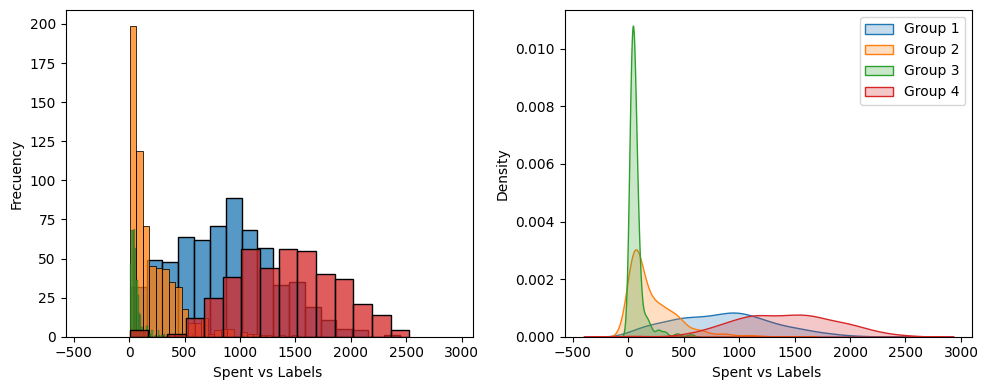

In [92]:
# Spent vs Classification
var = 'Spent'
var_title = 'Spent vs Labels '

filter = df['labels'] == 0
df_segment_1 = df.loc[filter]

filter = df['labels'] == 1
df_segment_2 = df.loc[filter]

filter = df['labels'] == 2
df_segment_3 = df.loc[filter]

filter = df['labels'] == 3
df_segment_4 = df.loc[filter]

# Adjust Matplotlib figure
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(10, 4), sharex=True)

# Histogram for each classification 
sns.histplot(data=df_segment_1, x=var, label="Group 1", kde=False, ax=ax[0])
sns.histplot(data=df_segment_2, x=var, label="Group 2", kde=False, ax=ax[0])
sns.histplot(data=df_segment_3, x=var, label="Group 3", kde=False, ax=ax[0])
sns.histplot(data=df_segment_4, x=var, label="Group 4", kde=False, ax=ax[0])
ax[0].set_xlabel(var_title)
ax[0].set_ylabel('Frecuency')

# Density curve for each classification 
sns.kdeplot(data=df_segment_1, x=var, label="Group 1", fill=True, ax=ax[1])
sns.kdeplot(data=df_segment_2,  x=var, label="Group 2", fill=True, ax=ax[1])
sns.kdeplot(data=df_segment_3,  x=var, label="Group 3", fill=True, ax=ax[1])
sns.kdeplot(data=df_segment_4,  x=var, label="Group 4", fill=True, ax=ax[1])
ax[1].set_xlabel(var_title)
ax[1].set_ylabel('Density')
ax[1].legend()

plt.tight_layout()

## NumDealsPurchases

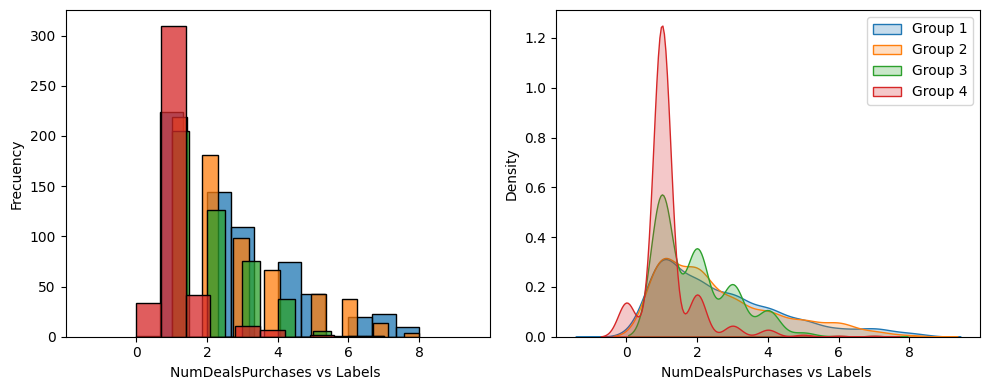

In [93]:
# NumDealsPurchases vs Classification
var = 'NumDealsPurchases'
var_title = 'NumDealsPurchases vs Labels '

filter = df['labels'] == 0
df_segment_1 = df.loc[filter]

filter = df['labels'] == 1
df_segment_2 = df.loc[filter]

filter = df['labels'] == 2
df_segment_3 = df.loc[filter]

filter = df['labels'] == 3
df_segment_4 = df.loc[filter]

# Adjust Matplotlib figure
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(10, 4), sharex=True)

# Histogram for each classification 
sns.histplot(data=df_segment_1, x=var, label="Group 1", kde=False, ax=ax[0])
sns.histplot(data=df_segment_2, x=var, label="Group 2", kde=False, ax=ax[0])
sns.histplot(data=df_segment_3, x=var, label="Group 3", kde=False, ax=ax[0])
sns.histplot(data=df_segment_4, x=var, label="Group 4", kde=False, ax=ax[0])
ax[0].set_xlabel(var_title)
ax[0].set_ylabel('Frecuency')

# Density curve for each classification 
sns.kdeplot(data=df_segment_1, x=var, label="Group 1", fill=True, ax=ax[1])
sns.kdeplot(data=df_segment_2,  x=var, label="Group 2", fill=True, ax=ax[1])
sns.kdeplot(data=df_segment_3,  x=var, label="Group 3", fill=True, ax=ax[1])
sns.kdeplot(data=df_segment_4,  x=var, label="Group 4", fill=True, ax=ax[1])
ax[1].set_xlabel(var_title)
ax[1].set_ylabel('Density')
ax[1].legend()

plt.tight_layout()

## NumWebPurchases

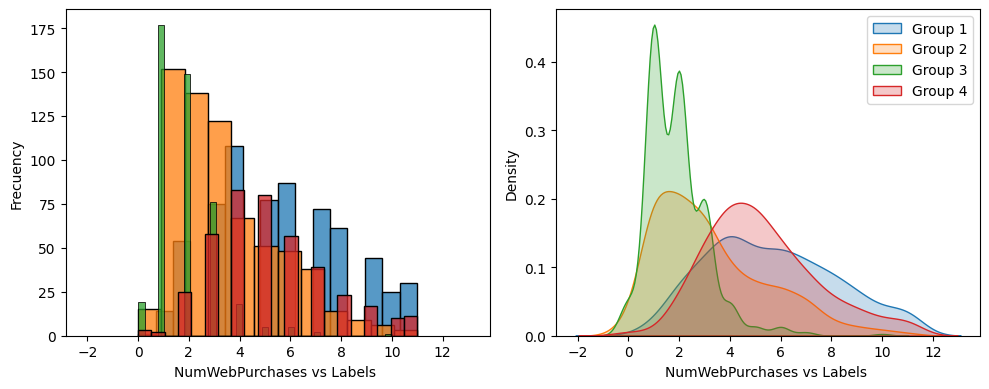

In [94]:
# NumWebPurchases vs Classification
var = 'NumWebPurchases'
var_title = 'NumWebPurchases vs Labels '

filter = df['labels'] == 0
df_segment_1 = df.loc[filter]

filter = df['labels'] == 1
df_segment_2 = df.loc[filter]

filter = df['labels'] == 2
df_segment_3 = df.loc[filter]

filter = df['labels'] == 3
df_segment_4 = df.loc[filter]

# Adjust Matplotlib figure
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(10, 4), sharex=True)

# Histogram for each classification 
sns.histplot(data=df_segment_1, x=var, label="Group 1", kde=False, ax=ax[0])
sns.histplot(data=df_segment_2, x=var, label="Group 2", kde=False, ax=ax[0])
sns.histplot(data=df_segment_3, x=var, label="Group 3", kde=False, ax=ax[0])
sns.histplot(data=df_segment_4, x=var, label="Group 4", kde=False, ax=ax[0])
ax[0].set_xlabel(var_title)
ax[0].set_ylabel('Frecuency')

# Density curve for each classification 
sns.kdeplot(data=df_segment_1, x=var, label="Group 1", fill=True, ax=ax[1])
sns.kdeplot(data=df_segment_2,  x=var, label="Group 2", fill=True, ax=ax[1])
sns.kdeplot(data=df_segment_3,  x=var, label="Group 3", fill=True, ax=ax[1])
sns.kdeplot(data=df_segment_4,  x=var, label="Group 4", fill=True, ax=ax[1])
ax[1].set_xlabel(var_title)
ax[1].set_ylabel('Density')
ax[1].legend()

plt.tight_layout()

## NumStorePurchases

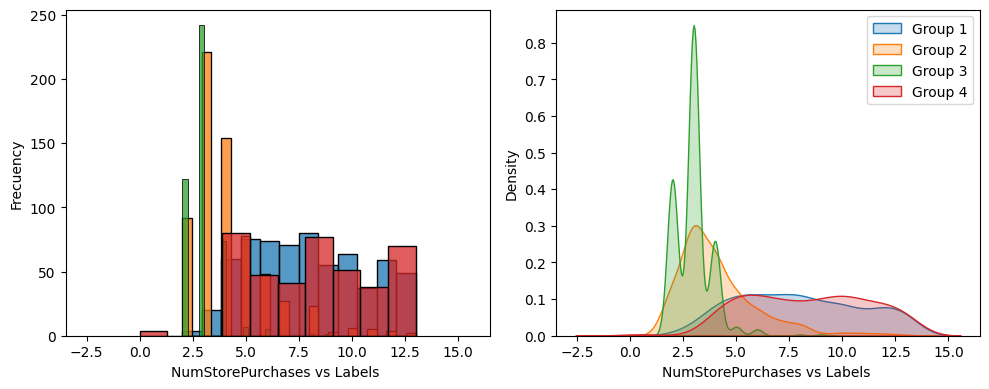

In [95]:
# NumStorePurchases vs Classification
var = 'NumStorePurchases'
var_title = 'NumStorePurchases vs Labels '

filter = df['labels'] == 0
df_segment_1 = df.loc[filter]

filter = df['labels'] == 1
df_segment_2 = df.loc[filter]

filter = df['labels'] == 2
df_segment_3 = df.loc[filter]

filter = df['labels'] == 3
df_segment_4 = df.loc[filter]

# Adjust Matplotlib figure
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(10, 4), sharex=True)

# Histogram for each classification 
sns.histplot(data=df_segment_1, x=var, label="Group 1", kde=False, ax=ax[0])
sns.histplot(data=df_segment_2, x=var, label="Group 2", kde=False, ax=ax[0])
sns.histplot(data=df_segment_3, x=var, label="Group 3", kde=False, ax=ax[0])
sns.histplot(data=df_segment_4, x=var, label="Group 4", kde=False, ax=ax[0])
ax[0].set_xlabel(var_title)
ax[0].set_ylabel('Frecuency')

# Density curve for each classification 
sns.kdeplot(data=df_segment_1, x=var, label="Group 1", fill=True, ax=ax[1])
sns.kdeplot(data=df_segment_2,  x=var, label="Group 2", fill=True, ax=ax[1])
sns.kdeplot(data=df_segment_3,  x=var, label="Group 3", fill=True, ax=ax[1])
sns.kdeplot(data=df_segment_4,  x=var, label="Group 4", fill=True, ax=ax[1])
ax[1].set_xlabel(var_title)
ax[1].set_ylabel('Density')
ax[1].legend()

plt.tight_layout()

## NumWebVisitsMonth

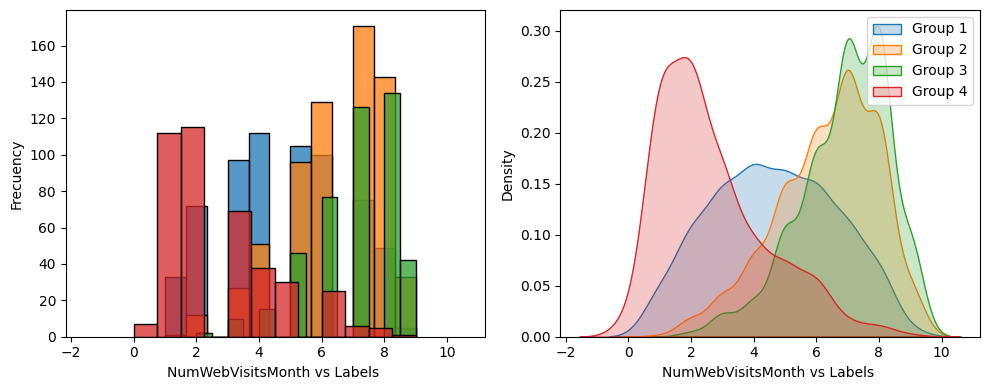

In [96]:
# NumWebVisitsMonth vs Classification
var = 'NumWebVisitsMonth'
var_title = 'NumWebVisitsMonth vs Labels '

filter = df['labels'] == 0
df_segment_1 = df.loc[filter]

filter = df['labels'] == 1
df_segment_2 = df.loc[filter]

filter = df['labels'] == 2
df_segment_3 = df.loc[filter]

filter = df['labels'] == 3
df_segment_4 = df.loc[filter]

# Adjust Matplotlib figure
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(10, 4), sharex=True)

# Histogram for each classification 
sns.histplot(data=df_segment_1, x=var, label="Group 1", kde=False, ax=ax[0])
sns.histplot(data=df_segment_2, x=var, label="Group 2", kde=False, ax=ax[0])
sns.histplot(data=df_segment_3, x=var, label="Group 3", kde=False, ax=ax[0])
sns.histplot(data=df_segment_4, x=var, label="Group 4", kde=False, ax=ax[0])
ax[0].set_xlabel(var_title)
ax[0].set_ylabel('Frecuency')

# Density curve for each classification 
sns.kdeplot(data=df_segment_1, x=var, label="Group 1", fill=True, ax=ax[1])
sns.kdeplot(data=df_segment_2,  x=var, label="Group 2", fill=True, ax=ax[1])
sns.kdeplot(data=df_segment_3,  x=var, label="Group 3", fill=True, ax=ax[1])
sns.kdeplot(data=df_segment_4,  x=var, label="Group 4", fill=True, ax=ax[1])
ax[1].set_xlabel(var_title)
ax[1].set_ylabel('Density')
ax[1].legend()

plt.tight_layout()

## Education 

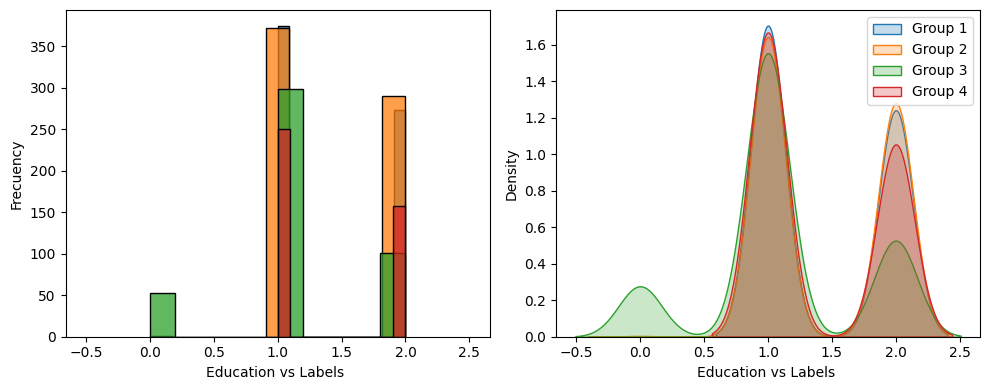

In [88]:
# Education vs Classification
var = 'Education'
var_title = 'Education vs Labels '

filter = df['labels'] == 0
df_segment_1 = df.loc[filter]

filter = df['labels'] == 1
df_segment_2 = df.loc[filter]

filter = df['labels'] == 2
df_segment_3 = df.loc[filter]

filter = df['labels'] == 3
df_segment_4 = df.loc[filter]

# Adjust Matplotlib figure
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(10, 4), sharex=True)

# Histogram for each classification 
sns.histplot(data=df_segment_1, x=var, label="Group 1", kde=False, ax=ax[0])
sns.histplot(data=df_segment_2, x=var, label="Group 2", kde=False, ax=ax[0])
sns.histplot(data=df_segment_3, x=var, label="Group 3", kde=False, ax=ax[0])
sns.histplot(data=df_segment_4, x=var, label="Group 4", kde=False, ax=ax[0])
ax[0].set_xlabel(var_title)
ax[0].set_ylabel('Frecuency')

# Density curve for each classification 
sns.kdeplot(data=df_segment_1, x=var, label="Group 1", fill=True, ax=ax[1])
sns.kdeplot(data=df_segment_2,  x=var, label="Group 2", fill=True, ax=ax[1])
sns.kdeplot(data=df_segment_3,  x=var, label="Group 3", fill=True, ax=ax[1])
sns.kdeplot(data=df_segment_4,  x=var, label="Group 4", fill=True, ax=ax[1])
ax[1].set_xlabel(var_title)
ax[1].set_ylabel('Density')
ax[1].legend()

plt.tight_layout()

## AcceptedCmp1

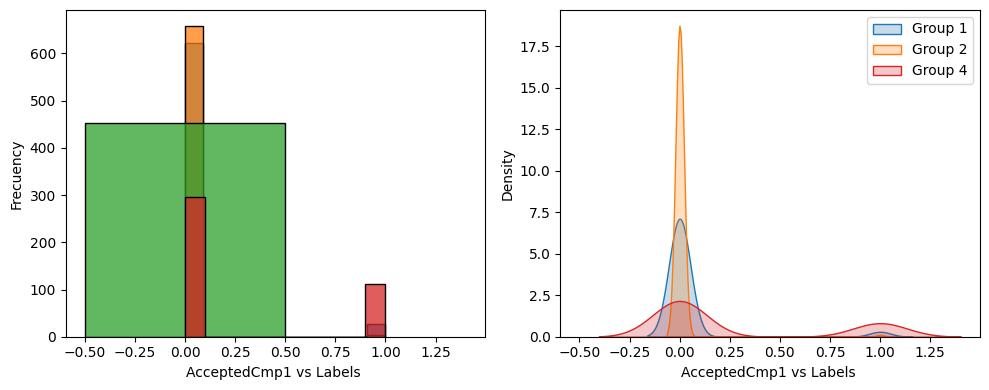

In [97]:
# AcceptedCmp1 vs Classification
var = 'AcceptedCmp1'
var_title = 'AcceptedCmp1 vs Labels '

filter = df['labels'] == 0
df_segment_1 = df.loc[filter]

filter = df['labels'] == 1
df_segment_2 = df.loc[filter]

filter = df['labels'] == 2
df_segment_3 = df.loc[filter]

filter = df['labels'] == 3
df_segment_4 = df.loc[filter]

# Adjust Matplotlib figure
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(10, 4), sharex=True)

# Histogram for each classification 
sns.histplot(data=df_segment_1, x=var, label="Group 1", kde=False, ax=ax[0])
sns.histplot(data=df_segment_2, x=var, label="Group 2", kde=False, ax=ax[0])
sns.histplot(data=df_segment_3, x=var, label="Group 3", kde=False, ax=ax[0])
sns.histplot(data=df_segment_4, x=var, label="Group 4", kde=False, ax=ax[0])
ax[0].set_xlabel(var_title)
ax[0].set_ylabel('Frecuency')

# Density curve for each classification 
sns.kdeplot(data=df_segment_1, x=var, label="Group 1", fill=True, ax=ax[1])
sns.kdeplot(data=df_segment_2,  x=var, label="Group 2", fill=True, ax=ax[1])
sns.kdeplot(data=df_segment_3,  x=var, label="Group 3", fill=True, ax=ax[1])
sns.kdeplot(data=df_segment_4,  x=var, label="Group 4", fill=True, ax=ax[1])
ax[1].set_xlabel(var_title)
ax[1].set_ylabel('Density')
ax[1].legend()

plt.tight_layout()

## AcceptedCmp2

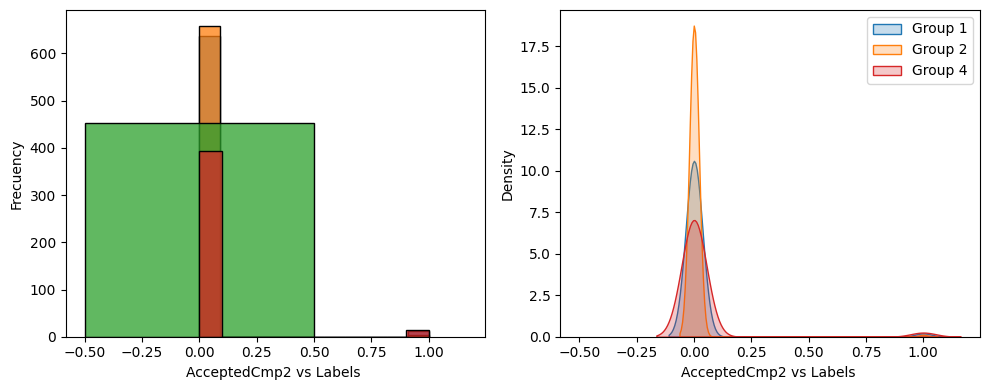

In [98]:
# Education vs Classification
var = 'AcceptedCmp2'
var_title = 'AcceptedCmp2 vs Labels '

filter = df['labels'] == 0
df_segment_1 = df.loc[filter]

filter = df['labels'] == 1
df_segment_2 = df.loc[filter]

filter = df['labels'] == 2
df_segment_3 = df.loc[filter]

filter = df['labels'] == 3
df_segment_4 = df.loc[filter]

# Adjust Matplotlib figure
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(10, 4), sharex=True)

# Histogram for each classification 
sns.histplot(data=df_segment_1, x=var, label="Group 1", kde=False, ax=ax[0])
sns.histplot(data=df_segment_2, x=var, label="Group 2", kde=False, ax=ax[0])
sns.histplot(data=df_segment_3, x=var, label="Group 3", kde=False, ax=ax[0])
sns.histplot(data=df_segment_4, x=var, label="Group 4", kde=False, ax=ax[0])
ax[0].set_xlabel(var_title)
ax[0].set_ylabel('Frecuency')

# Density curve for each classification 
sns.kdeplot(data=df_segment_1, x=var, label="Group 1", fill=True, ax=ax[1])
sns.kdeplot(data=df_segment_2,  x=var, label="Group 2", fill=True, ax=ax[1])
sns.kdeplot(data=df_segment_3,  x=var, label="Group 3", fill=True, ax=ax[1])
sns.kdeplot(data=df_segment_4,  x=var, label="Group 4", fill=True, ax=ax[1])
ax[1].set_xlabel(var_title)
ax[1].set_ylabel('Density')
ax[1].legend()

plt.tight_layout()

## AcceptedCmp3

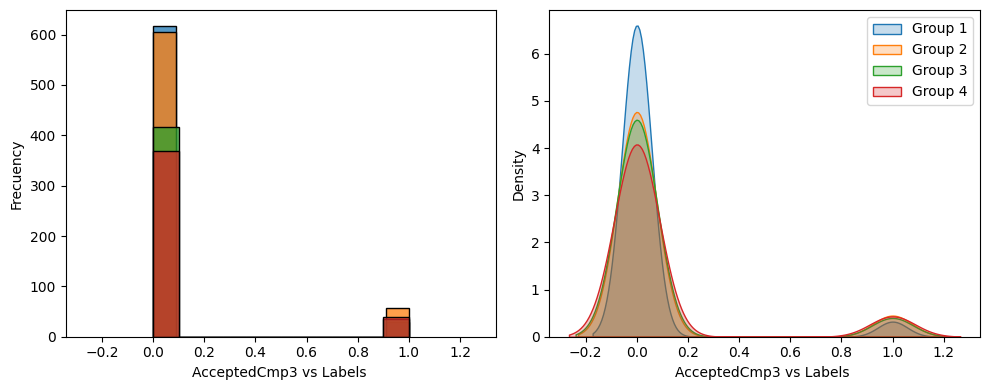

In [99]:
# AcceptedCmp3 vs Classification
var = 'AcceptedCmp3'
var_title = 'AcceptedCmp3 vs Labels '

filter = df['labels'] == 0
df_segment_1 = df.loc[filter]

filter = df['labels'] == 1
df_segment_2 = df.loc[filter]

filter = df['labels'] == 2
df_segment_3 = df.loc[filter]

filter = df['labels'] == 3
df_segment_4 = df.loc[filter]

# Adjust Matplotlib figure
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(10, 4), sharex=True)

# Histogram for each classification 
sns.histplot(data=df_segment_1, x=var, label="Group 1", kde=False, ax=ax[0])
sns.histplot(data=df_segment_2, x=var, label="Group 2", kde=False, ax=ax[0])
sns.histplot(data=df_segment_3, x=var, label="Group 3", kde=False, ax=ax[0])
sns.histplot(data=df_segment_4, x=var, label="Group 4", kde=False, ax=ax[0])
ax[0].set_xlabel(var_title)
ax[0].set_ylabel('Frecuency')

# Density curve for each classification 
sns.kdeplot(data=df_segment_1, x=var, label="Group 1", fill=True, ax=ax[1])
sns.kdeplot(data=df_segment_2,  x=var, label="Group 2", fill=True, ax=ax[1])
sns.kdeplot(data=df_segment_3,  x=var, label="Group 3", fill=True, ax=ax[1])
sns.kdeplot(data=df_segment_4,  x=var, label="Group 4", fill=True, ax=ax[1])
ax[1].set_xlabel(var_title)
ax[1].set_ylabel('Density')
ax[1].legend()

plt.tight_layout()

## AcceptedCmp4

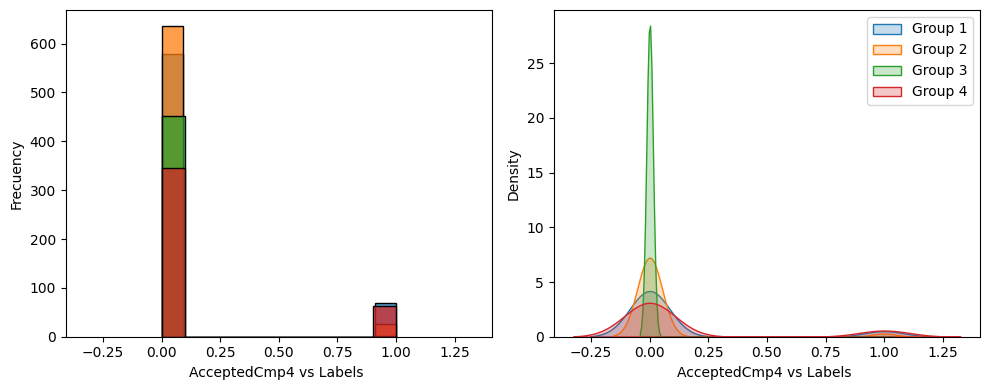

In [100]:
# AcceptedCmp4 vs Classification
var = 'AcceptedCmp4'
var_title = 'AcceptedCmp4 vs Labels '

filter = df['labels'] == 0
df_segment_1 = df.loc[filter]

filter = df['labels'] == 1
df_segment_2 = df.loc[filter]

filter = df['labels'] == 2
df_segment_3 = df.loc[filter]

filter = df['labels'] == 3
df_segment_4 = df.loc[filter]

# Adjust Matplotlib figure
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(10, 4), sharex=True)

# Histogram for each classification 
sns.histplot(data=df_segment_1, x=var, label="Group 1", kde=False, ax=ax[0])
sns.histplot(data=df_segment_2, x=var, label="Group 2", kde=False, ax=ax[0])
sns.histplot(data=df_segment_3, x=var, label="Group 3", kde=False, ax=ax[0])
sns.histplot(data=df_segment_4, x=var, label="Group 4", kde=False, ax=ax[0])
ax[0].set_xlabel(var_title)
ax[0].set_ylabel('Frecuency')

# Density curve for each classification 
sns.kdeplot(data=df_segment_1, x=var, label="Group 1", fill=True, ax=ax[1])
sns.kdeplot(data=df_segment_2,  x=var, label="Group 2", fill=True, ax=ax[1])
sns.kdeplot(data=df_segment_3,  x=var, label="Group 3", fill=True, ax=ax[1])
sns.kdeplot(data=df_segment_4,  x=var, label="Group 4", fill=True, ax=ax[1])
ax[1].set_xlabel(var_title)
ax[1].set_ylabel('Density')
ax[1].legend()

plt.tight_layout()

## AcceptedCmp5

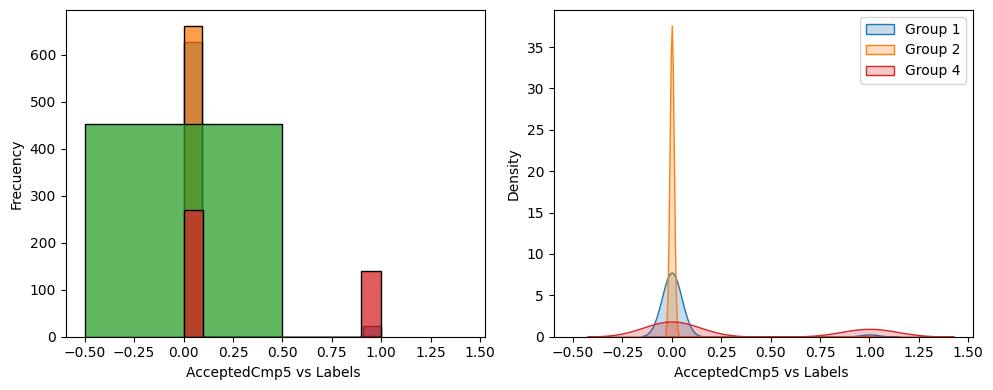

In [101]:
# AcceptedCmp5 vs Classification
var = 'AcceptedCmp5'
var_title = 'AcceptedCmp5 vs Labels '

filter = df['labels'] == 0
df_segment_1 = df.loc[filter]

filter = df['labels'] == 1
df_segment_2 = df.loc[filter]

filter = df['labels'] == 2
df_segment_3 = df.loc[filter]

filter = df['labels'] == 3
df_segment_4 = df.loc[filter]

# Adjust Matplotlib figure
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(10, 4), sharex=True)

# Histogram for each classification 
sns.histplot(data=df_segment_1, x=var, label="Group 1", kde=False, ax=ax[0])
sns.histplot(data=df_segment_2, x=var, label="Group 2", kde=False, ax=ax[0])
sns.histplot(data=df_segment_3, x=var, label="Group 3", kde=False, ax=ax[0])
sns.histplot(data=df_segment_4, x=var, label="Group 4", kde=False, ax=ax[0])
ax[0].set_xlabel(var_title)
ax[0].set_ylabel('Frecuency')

# Density curve for each classification 
sns.kdeplot(data=df_segment_1, x=var, label="Group 1", fill=True, ax=ax[1])
sns.kdeplot(data=df_segment_2,  x=var, label="Group 2", fill=True, ax=ax[1])
sns.kdeplot(data=df_segment_3,  x=var, label="Group 3", fill=True, ax=ax[1])
sns.kdeplot(data=df_segment_4,  x=var, label="Group 4", fill=True, ax=ax[1])
ax[1].set_xlabel(var_title)
ax[1].set_ylabel('Density')
ax[1].legend()

plt.tight_layout()